# Database Implementation

## Database Creation

In [ ]:
import sqlite3
import os
from google.colab import drive, userdata

drive.mount('/content/drive')

db_path = '/content/drive/MyDrive/DecodingDemocracy/db.sqlite'

!pip install --no-cache-dir -r '/content/drive/My Drive/DecodingDemocracy/requirements.txt'

conn = sqlite3.connect('db.sqlite')
cursor = conn.cursor()

def create_db():
    cursor.execute('DROP TABLE IF EXISTS Consultation')
    cursor.execute('DROP TABLE IF EXISTS Question')
    cursor.execute('DROP TABLE IF EXISTS Responder')
    cursor.execute('DROP TABLE IF EXISTS Response')
    cursor.execute('DROP TABLE IF EXISTS Clusters')
    cursor.execute('DROP TABLE IF EXISTS Topics')

    # Create Consultation table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Consultation (
        id INTEGER PRIMARY KEY,
        consultation_name TEXT,
        date DATE,
        published_responses_url TEXT,
        government_analysis_url TEXT,
        prerequisite_material_url TEXT
    )
    ''')
    # Create Question table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Question (
        id TEXT PRIMARY KEY,
        consultation_id INTEGER,
        question TEXT,
        multiplechoice BOOLEAN,
        FOREIGN KEY (consultation_id) REFERENCES Consultation(id)
    )
    ''')
    # Create Responder table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Responder (
        id INTEGER PRIMARY KEY,
        submitted_date DATE,
        published_response_url TEXT,
        type TEXT,
        consultation_id INTEGER,
        FOREIGN KEY (consultation_id) REFERENCES Consultation(id)
    )
    ''')
    # Create Response table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Response (
        id INTEGER PRIMARY KEY,
        question_id TEXT,
        responder_id INTEGER,
        response TEXT,
        consultation_id INTEGER,
        sentiment_value FLOAT,
        topic_id TEXT,
        cluster_id TEXT,
        FOREIGN KEY (question_id) REFERENCES Question(id),
        FOREIGN KEY (responder_id) REFERENCES Responder(id),
        FOREIGN KEY (consultation_id) REFERENCES Consultation(id),
        FOREIGN KEY (topic_id) REFERENCES Topics(topic_id),
        FOREIGN KEY (cluster_id) REFERENCES Clusters(cluster_id)
    )
    ''')

    # Create Cluster table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Clusters (
        cluster_id TEXT PRIMARY KEY,
        cluster_label TEXT
    )
    ''')

    # Create Topics table
    cursor.execute('''
    CREATE TABLE IF NOT EXISTS Topics (
        topic_id TEXT PRIMARY KEY,
        topic_label TEXT,
        cluster_id TEXT,
        FOREIGN KEY (cluster_id) REFERENCES Clusters(cluster_id)
    )
    ''')

    conn.commit()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 57.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 33.9 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement Brlapi==0.8.2 (from versions: none)
ERROR: No matching distribution found for Brlapi==0.8.2


## Database Population

### Extract excel data into csv files

In [ ]:
# script to convert excel files to csv files that can be imported into mariadb
import pandas as pd

RESPONDER_TYPE_COLUMN = 'Are you responding as an individual or an organisation? - Are you responding as an individual or an organisation?'
CONSULTATIONS = [
    {
        "consultation_name": "Consultation on a Draft Referendum Bill",
        "date": "2016-10-20",
        "published_responses_url": "https://consult.gov.scot/elections-and-constitutional-development-division/draft-referendum-bill/consultation/view_respondent?uuId=",
        "government_analysis_url": "https://www.gov.scot/publications/consultation-draft-referendum-bill-analysis-responses/",
        "prerequisite_material_url": "https://webarchive.nrscotland.gov.uk/3000/https://www.gov.scot/publications/consultation-draft-referendum-bill/",
        "excel_file": "/content/drive/My Drive/DecodingDemocracy/excel/2016responses.xlsx",
        "id": 1,
        "start_column": 6,
        "end_column": 11
    },
    {
        "consultation_name": "Consultation on a Electoral Reform",
        "date": "2017-12-19",
        "published_responses_url": "https://consult.gov.scot/elections/electoral-reform/consultation/view_respondent?uuId=",
        "government_analysis_url": "https://www.gov.scot/publications/electoral-reform-consultation-analysis/",
        "prerequisite_material_url": "https://www.gov.scot/publications/consultation-electoral-reform/",
        "excel_file": "/content/drive/My Drive/DecodingDemocracy/excel/2017responses.xlsx",
        "id": 2,
        "start_column": 0,
        "end_column": 45
    },
    {
        "consultation_name": "Consultation on a Electoral Reform",
        "date": "2022-12-14",
        "published_responses_url": "https://consult.gov.scot/constitution-and-cabinet/electoral-reform/consultation/view_respondent?uuId=",
        "government_analysis_url": "https://www.gov.scot/publications/electoral-reform-consultation-analysis-2/",
        "prerequisite_material_url": "https://www.gov.scot/publications/electoral-reform-consultation/",
        "excel_file": "/content/drive/My Drive/DecodingDemocracy/excel/2023responses.xlsx",
        "id": 3,
        "start_column": 0,
        "end_column": 53
    }
]

def get_consultations():
    # DB columns are consultation_id, name, date, published_responses_url, government_analysis_url, prerequisite_material_url
    consultations = []
    for c in CONSULTATIONS:
        consultations.append({
            'id': c['id'],
            'consultation_name': c['consultation_name'],
            'date': c['date'],
            'published_responses_url': c['published_responses_url'],
            'government_analysis_url': c['government_analysis_url'],
            'prerequisite_material_url': c['prerequisite_material_url']
        })
    file = pd.DataFrame(consultations)
    # write the dataframe to a csv file
    file.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/consultations.csv', index=False)

def get_responders(filename,consultation_id):
    # read Unique ID, Submitted Date, Responder Type and Published Response URL columns
    file = pd.read_excel(filename, sheet_name=0)
    # create a new dataframe with the columns
    file = pd.DataFrame({
        'id': file['Unique ID'],
        'submitted_date': file['Submitted Date'],
        'type': file[RESPONDER_TYPE_COLUMN],
        'published_response_url': file['Published Response URL'],
        'consultation_id': consultation_id
    })
    # write the dataframe to a csv file
    file.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/responders' + str(consultation_id) + '.csv', index=False)

def get_questions(start_column, end_column, filename, consultation_id):
    # get questions from the excel file
    file = pd.read_excel(filename, sheet_name=0)
    # get the questions from the columns
    questions = file.columns[start_column:end_column]
    # create a new dataframe with the questions
    file = pd.DataFrame({
        'id': [str(consultation_id) + '-' + str(i) for i in range(1, len(questions)+1)],
        'consultation_id': consultation_id,
        'question': questions,
        'multiplechoice': 0
    })
    # write the dataframe to a csv file
    file.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/questions' + str(consultation_id) + '.csv', index=False)

def get_responses(start_column,end_column,filename,consultation_id):
    # OpenResponse table: id, question_id, responder_id, response, submitted_date
    # MultipleChoiceResponse table: id, question_id, responder_id, response, submitted_date
    # to upload all data, we need to upload each response with the question id, responder id and consultation_id
    df = pd.read_excel(filename, sheet_name=0)

    responses_df = pd.DataFrame(columns=['question_id', 'responder_id', 'response', 'consultation_id'])

    current_id = 0
    for i in range(start_column, end_column):
        # get column i responses from the excel file
        responses = df.iloc[:, i]
        # remove new line characters, paragraph and line separators from the responses
        responses = responses.str.replace('\n', ' ')
        responses = responses.str.replace('\r', ' ')
        responses = responses.str.replace('\u2028', ' ')
        num_responses = len(responses)
        # add all the responses to the dataframe
        responses_df = pd.concat(
            [
                responses_df,
                pd.DataFrame({
                    'question_id': [str(consultation_id) + '-' + str(i-start_column+1)] * num_responses,
                    'responder_id': df['Unique ID'],
                    'response': responses,
                    'consultation_id': [consultation_id for _ in range(num_responses)],
                })
            ], ignore_index=True)
        current_id += num_responses + 1

    # write the dataframe to a csv file
    responses_df.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/responses' + str(consultation_id) + '.csv', index=False)

def create_csv_files():
  get_consultations()
  for c in CONSULTATIONS:
      get_responders(c['excel_file'],c['id'])
      get_questions(c['start_column'],c['end_column'],c['excel_file'],c['id'])
      get_responses(c['start_column'],c['end_column'],c['excel_file'],c['id'])

  # combine all the responders, questions and responses into one file
  responders = pd.concat([pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/responders' + str(i+1) + '.csv') for i in range(len(CONSULTATIONS))], ignore_index=True)
  questions = pd.concat([pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/questions' + str(i+1) + '.csv') for i in range(len(CONSULTATIONS))], ignore_index=True)
  responses = pd.concat([pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/responses' + str(i+1) + '.csv') for i in range(len(CONSULTATIONS))], ignore_index=True)
  # write the dataframes to csv files
  responders.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/responders.csv', index=False)
  questions.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/questions.csv', index=False)
  responses.to_csv('/content/drive/My Drive/DecodingDemocracy/csv/responses.csv', index=False)

### Load data into Database



In [ ]:
# Load csv files into database
def load_data_to_db(conn, cursor):
  # Load consultations.csv into Consultation table
  consultation_df = pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/consultations.csv')
  consultation_df.to_sql('Consultation', conn, if_exists='append', index=False)

  # Load questions.csv into Question table
  question_df = pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/questions.csv')
  question_df.to_sql('Question', conn, if_exists='append', index=False)

  # Load responders.csv into Responder table
  responder_df = pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/responders.csv')
  responder_df.to_sql('Responder', conn, if_exists='append', index=False)

  # Load responses.csv into Response table
  response_df = pd.read_csv('/content/drive/My Drive/DecodingDemocracy/csv/responses.csv')
  response_df.to_sql('Response', conn, if_exists='append', index=False)

  # Multiple choice questions hardcoded
  multiplechoice2 = ['2-1', '2-4', '2-6', '2-7', '2-9', '2-11', '2-12', '2-13', '2-18', '2-19', '2-20', '2-22', '2-23', '2-24', '2-26', '2-28', '2-29', '2-30', '2-32', '2-34', '2-39', '2-41']
  multiplechoice3 = ['3-1', '3-2', '3-4', '3-6', '3-7', '3-9', '3-10', '3-13', '3-15', '3-17', '3-19', '3-20', '3-23', '3-25', '3-27', '3-28', '3-29', '3-30', '3-32', '3-33', '3-36', '3-37', '3-39', '3-41', '3-42', '3-43', '3-45', '3-47', '3-50', '3-53']

  # set multiplechoice field in Question table
  sql = 'UPDATE Question SET multiplechoice = 1 WHERE id=?'
  for i in multiplechoice2:
    cursor.execute(sql, (i,))
  for i in multiplechoice3:
    cursor.execute(sql, (i,))
  conn.commit()


if os.path.exists(db_path): # already exists - no need to create db
    print("Database exists. Copying to Colab environment.")
    !cp {db_path} .
else:
  create_db()
  create_csv_files()
  load_data_to_db(conn, cursor)

# Save database in google drive
!cp db.sqlite /content/drive/MyDrive/DecodingDemocracy/

Database exists. Copying to Colab environment.


### Check the data has been loaded correctly

# Library Installations and Imports

In [ ]:
# Installations
# !pip install nltk
# !python -m nltk.downloader popular
!pip install sentence-transformers
!pip install vaderSentiment
!pip install textblob
!pip install demoji
# !pip install openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 14.2 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125923 sha256=2d1245069bc7e6469e420968f6ce22e597bc4ba5135690003e82bd6c045f9874
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 1.6 MB/s eta 0:00:00


In [ ]:
# Data Analysis and Manipulation
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import random
import csv
import json
import os
import pickle
import string
import regex as re
import time
import concurrent.futures

# NLP and Text Processing
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import demoji

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from gensim import corpora, models

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS

# Machine Learning and Clustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
import colorcet as cc
# import hdbscan
# import umap

# Deep Learning and Transformers
from sentence_transformers import SentenceTransformer
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification, TextClassificationPipeline
import torch
from scipy.special import softmax
import urllib.request
from gensim.models.phrases import Phrases, Phraser
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel
from gensim.models import TfidfModel, LdaMulticore


# import openai
# from openai.embeddings_utils import get_embedding

# Progress Monitoring
from tqdm import tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 1.3 MB/s eta 0:00:00


# Generic Data Analysis

## Multiple Choice Responses

In [ ]:
def analyse_mcqs():
  # Get only multiple choice questions from each consultation
  cursor.execute('SELECT id, question FROM Question WHERE multiplechoice = 1 AND consultation_id=2')
  consultation_2_MCQs = cursor.fetchall()
  cursor.execute('SELECT id, question FROM Question WHERE multiplechoice = 1 AND consultation_id=3')
  consultation_3_MCQs = cursor.fetchall()

  query = """
  SELECT q.id AS question_id, res.response, r.id AS responder_id
  FROM Response res
  JOIN Question q ON res.question_id = q.id
  JOIN Responder r ON res.responder_id = r.id
  WHERE q.id = ?;
  """

  question_dict = dict()

  # For each MCQ, query the responses and load them into a pandas DataFrame
  for mcq_id, mcq_text in consultation_2_MCQs + consultation_3_MCQs:
      multiple_choice_df = pd.read_sql_query(query, conn, params=[mcq_id])
      grouped = multiple_choice_df.groupby(['responder_id', 'response']).size().unstack(fill_value=0)
      # Store the question text and the DataFrame together
      question_dict[mcq_id] = (mcq_text, grouped)

  # Analyse distribution of responses for each MCQ
  for question_id, (question_text, df) in question_dict.items():
      response_counts = df.sum()  # Calculate the sum of each column to get the count of each response
      response_percentages = (response_counts / len(df)) * 100
      response_distribution_df = response_percentages.reset_index().rename(columns={'index': 'response', 0: 'percentage'})

      # Display the question and its response distribution table
      print(f"Question ID {question_id}: {question_text}")
      display(response_distribution_df)

# Deep Learning Analysis


### Text pre processing

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')

# Custom stopwords that don't include negations like "not" or didn't so sentiment analysis is not impacted
stopwords = set([
    "a", "an", "the", "this", "that", "it", "is", "am", "are", "was", "were", "be", "being", "been",
    "have", "has", "had", "do", "does", "did", "doing", "and", "or", "but", "on", "in", "at", "by",
    "with", "of", "for", "as", "to", "from", "up", "down", "why", "how", "when", "where", "what",
    "should", "would", "could", "might", "may", "must", "shall", "can", "will", "i", "you", "he", "she",
    "we", "they", "my", "your", "his", "her", "its", "our", "their", "me", "him", "us", "them", "yours",
    "mine", "hers", "ours", "theirs"
])
lemmatizer = WordNetLemmatizer()

# Returns tokenised words in root form
def pre_process(text, stops=None):
    punct = '!"#$%&\'()*+-/<=>?@[\\]^`{|}~.,'
    text = text.lower()
    # Remove punctuation
    text = ''.join([char for char in text if char not in punct])
    # Remove emojis
    text = demoji.replace(text,'')
    # Tokenize
    text = word_tokenize(text)
    if stops is not None:
      # Remove custom stopwords
      text = [w for w in text if not w in stops]
    # Lemmatize (reduce words to root form)
    text = [lemmatizer.lemmatize(token) for token in text]
    return text

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


### Functions to get open questions and responses

In [ ]:
# Get only open questions from a consultation
def get_open_questions(consultation_num, conn, cursor):
  query = "SELECT id FROM Question WHERE multiplechoice IS NOT 1 AND consultation_id=?"
  cursor.execute(query, (consultation_num,))
  open_qs = [x[0] for x in cursor.fetchall()]
  return open_qs

# Get all responses to a question
def get_responses_to_question(question_id):
  query = 'SELECT id, response FROM Response WHERE question_id = ? AND response IS NOT NULL'
  cursor.execute(query, (question_id,))
  return [(x[0],x[1]) for x in cursor.fetchall()]

# Return dictionary of question id, response id and response for a list of question ids
def get_open_responses(questions):
  query = """
  SELECT q.id AS question_id, q.question, res.id, res.response, r.id AS responder_id
  FROM Response res
  JOIN Question q ON res.question_id = q.id
  JOIN Responder r ON res.responder_id = r.id
  WHERE q.id = ? AND res.response IS NOT NULL;
  """

  response_data_dict = dict() # To store all responses for all consultations

  # For each question, query responses and load them into a list of dictionaries
  for q in questions:
      cursor.execute(query, (q,))
      responses = cursor.fetchall()

      response_list = []
      for response in responses:
          response_dict = {
              'question_id': response[0],
              'response_id': response[2],
              'response': response[3],
          }
          response_list.append(response_dict)

      response_data_dict[q] = response_list

  return response_data_dict

## Sentiment Analysis

### Compare and validate sentiment values

---



Get open ended questions into a dictionary and sample questions to manually analyse

In [ ]:
vs_analyzer = SentimentIntensityAnalyzer()

roberta_model = "cardiffnlp/twitter-roberta-base-sentiment"
roberta_tokenizer = AutoTokenizer.from_pretrained(roberta_model)
r_model = AutoModelForSequenceClassification.from_pretrained(roberta_model)

distilbert_model = "lxyuan/distilbert-base-multilingual-cased-sentiments-student"
distilbert_tokenizer = AutoTokenizer.from_pretrained(distilbert_model)
d_model = AutoModelForSequenceClassification.from_pretrained(distilbert_model)
distilbert_classifier = TextClassificationPipeline(model=d_model, tokenizer=distilbert_tokenizer, return_all_scores=True, device=0)

tokenizer_kwargs = {'padding':True,'truncation':True,'max_length':512}

# Get responses to all open questions
questions = get_open_questions(1, conn, cursor)
responses_dict = get_open_responses(questions)

# Download label mapping (negative, positive, neutral)
labels=[]
mapping_link = f"https://raw.githubusercontent.com/cardiffnlp/tweeteval/main/datasets/sentiment/mapping.txt"
with urllib.request.urlopen(mapping_link) as f:
    html = f.read().decode('utf-8').split("\n")
    csvreader = csv.reader(html, delimiter='\t')
labels = [row[1] for row in csvreader if len(row) > 1]

# Open the existing CSV file with human sentiment values
input_file_path = '/content/drive/MyDrive/DecodingDemocracy/sample_sentiment_values.csv'
df = pd.read_csv(input_file_path)

# Add further sentiment columns to the DataFrame
roberta_sentiments = []
vader_sentiments = []
textblob_sentiments = []
distilbert_sentiments = []

vader_differences = []
roberta_differences = []
textblob_differences = []
distilbert_differences = []

for idx, ans in enumerate(df['answer']):
    if ans is not None:
      ans = " ".join(pre_process(ans))
      # vader sentiment analysis
      vs = vs_analyzer.polarity_scores(ans)
      vader_sentiments.append(round(vs['compound'],3))
      # texblob sentiment analysis
      tb = TextBlob(ans)
      textblob_sentiments.append(round(tb.sentiment.polarity,3))
      # roberta sentiment analysis
      encoded_input = roberta_tokenizer(ans, return_tensors='pt', max_length=512, truncation=True)
      output = r_model(**encoded_input)
      scores = output[0][0].detach().numpy()
      scores = softmax(scores)
      ranking = np.argsort(scores)
      ranking = ranking[::-1]
      score, label = 0, ""

      for i in range(scores.shape[0]):
          l = labels[ranking[i]]
          s = scores[ranking[i]]
          if l == "negative":
            score -= abs(s)
          elif l == "positive":
            score += abs(s)
      roberta_sentiments.append(round(score,3))

      # distilbert sentiment analysis
      outputs = distilbert_classifier(ans, **tokenizer_kwargs)[0]
      dist_score = 0
      for o in outputs:
        if o['label'] == "negative":
          dist_score -= abs(o['score'])
        elif o['label'] == "positive":
          dist_score += abs(o['score'])
      distilbert_sentiments.append(round(dist_score,3))

      # Calculate absolute differences between model predictions and human sentiment
      vader_diff = abs(vader_sentiments[idx] - df['human'][idx])
      roberta_diff = abs(roberta_sentiments[idx] - df['human'][idx])
      textblob_diff = abs(textblob_sentiments[idx] - df['human'][idx])
      distilbert_diff = abs(distilbert_sentiments[idx] - df['human'][idx])

      # Append differences to lists
      vader_differences.append(vader_diff)
      roberta_differences.append(roberta_diff)
      textblob_differences.append(textblob_diff)
      distilbert_differences.append(distilbert_diff)

# Calculate average absolute differences
avg_vader_difference = sum(vader_differences) / len(vader_differences)
avg_roberta_difference = sum(roberta_differences) / len(roberta_differences)
avg_textblob_difference = sum(textblob_differences) / len(textblob_differences)
avg_distilbert_difference = sum(distilbert_differences) / len(distilbert_differences)

print(f'Average Vader Difference: {avg_vader_difference:.3f}')
print(f'Average Roberta Difference: {avg_roberta_difference:.3f}')
print(f'Average TextBlob Difference: {avg_textblob_difference:.3f}')
print(f'Average Distilbert Difference: {avg_distilbert_difference:.3f}')

df['vader'] = vader_sentiments
df['roberta'] = roberta_sentiments
df['textblob'] = textblob_sentiments
df['distilbert'] = distilbert_sentiments

# Overwrite the CSV file with updated data
df.to_csv('/content/drive/MyDrive/DecodingDemocracy/sample_sentiment_values.csv', index=False, encoding='utf-8')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

KeyboardInterrupt: 


### OpenAI API sentiment analysis

In [ ]:
# openai.api_key = OPENAI_KEY
# embedding model parameters
embedding_model = "text-embedding-ada-002"
embedding_encoding = "cl100k_base"  # this the encoding for text-embedding-ada-002
max_tokens = 8000  # the maximum for text-embedding-ada-002 is 8191

# load & inspect dataset
input_datapath = "/content/drive/My Drive/DecodingDemocracy/csv/responses2.csv"  # to save space, we provide a pre-filtered dataset
df = pd.read_csv(input_datapath, index_col=False)
df = df[["question_id", "responder_id", "response", "submitted_date", "consultation_id"]]
df = df.dropna()
df["combined"] = (
    "Title: " + df.question_id.str.strip() + "; Content: " + df.response.str.strip()
)
df.head(2)
print(df.combined.apply(lambda x: get_embedding(x, engine=embedding_model)))


### Compare Human sentiment analysis with Vader, TextBlob, RoBERTa and Distilbert to decide which one to use

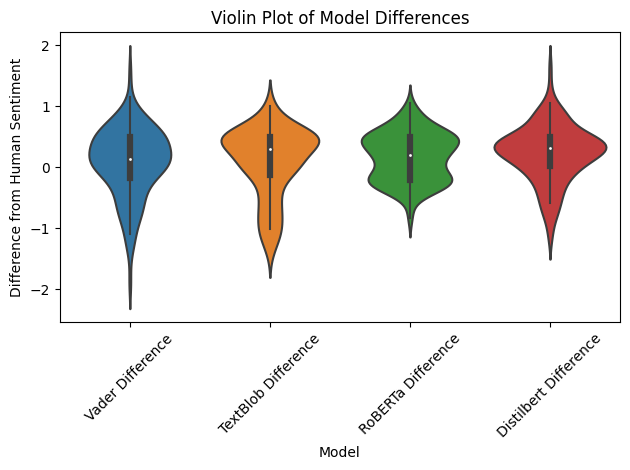

In [ ]:
# Load the CSV file
df = pd.read_csv('/content/drive/MyDrive/DecodingDemocracy/sample_sentiment_values.csv')

# Calculate difference
df['Vader Difference'] = df['human'] - df['vader']
df['TextBlob Difference'] = df['human'] - df['textblob']
df['RoBERTa Difference'] = df['human'] - df['roberta']
df['Distilbert Difference'] = df['human'] - df['distilbert']

# Prepare data for plotting
plot_data = pd.melt(df,
                    value_vars=['Vader Difference', 'TextBlob Difference', 'RoBERTa Difference', 'Distilbert Difference'],
                    var_name='Model', value_name='Difference')

# Violin Plot
sns.violinplot(x='Model', y='Difference', data=plot_data)
plt.title('Violin Plot of Model Differences')
plt.ylabel('Difference from Human Sentiment')
plt.xlabel('Model')
plt.xticks(rotation=45)  # Rotates labels by 45 degrees

plt.tight_layout()
plt.show()


From the violin plots, it seems that RoBERTa produced the most accurate sentiment values, when compared with the human values we assigned. The roberta violin plot is wider around zero values showing most of the difference in values between human and roberta sentiment was close to 0. However, since it is a very large and slow model, we will use the more efficient distilbert model for our sentiment analysis, which still produces similar results.

### Distilbert sentiment analysis

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("lxyuan/distilbert-base-multilingual-cased-sentiments-student")
model = AutoModelForSequenceClassification.from_pretrained("lxyuan/distilbert-base-multilingual-cased-sentiments-student")

distilbert_classifier = TextClassificationPipeline(model=model, tokenizer=tokenizer, return_all_scores=True, device=0)

# Create a function to analyze sentiments and update sentiment_value in the "Response" table
def analyze_sentiments(responses_dict, batch_size=32, query='UPDATE Response SET sentiment_value = ? WHERE id = ?'):
    results = defaultdict(lambda: {'negative': 0, 'neutral': 0, 'positive': 0})
    for q, responses in tqdm(responses_dict.items()):
        tokenizer_kwargs = {'padding': True, 'truncation': True, 'max_length': 512}
        for res in responses:
            response = res.get('response')
            if response is None:
              continue
            response = " ".join(pre_process(response))
            id = res.get('response_id')
            outputs = distilbert_classifier(response, **tokenizer_kwargs)[0]
            sentiment_value = 0
            for o in outputs:
                results[q][o['label']] += o['score']
                if o['label'] == "negative":
                  sentiment_value -= abs(o['score'])
                elif o['label'] == "positive":
                  sentiment_value += abs(o['score'])
            rounded = round(sentiment_value,3)
            # Update sentiment_value in the "Response" table using SQL
            cursor.execute(query, (rounded, id,))
            conn.commit()

    return results

# Visualization of sentiment with a bar chart showing each category
def plot_sentiment_distribution(sentiment_summary, analysis_type):
    for k, sentiment_count in sentiment_summary.items():
        categories = ['negative', 'neutral', 'positive']
        counts = [sentiment_count[category] for category in categories]
        plt.bar(categories, counts, color=['red', 'grey', 'green'])
        plt.title(f'{analysis_type} Sentiment Distribution for Question {k}')
        plt.ylabel('Count')
        plt.xticks(rotation=45)  # Rotates labels by 45 degrees
        plt.show()

tokenizer_config.json:   0%|          | 0.00/373 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/759 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/541M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/pipelines/text_classification.py:105: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


### Consultation 1 Sentiment Analysis


  0%|          | 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(

100%|██████████| 5/5 [08:05<00:00, 97.11s/it]


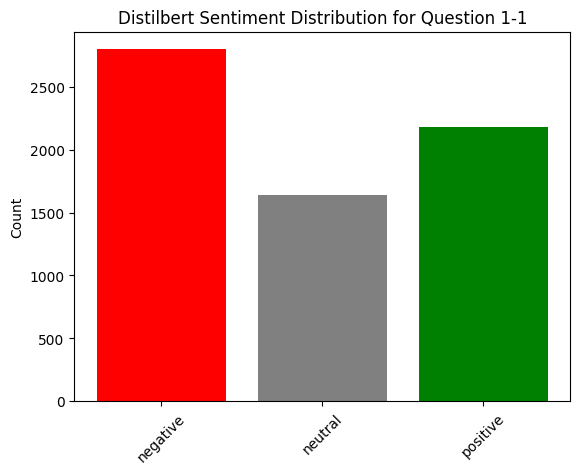

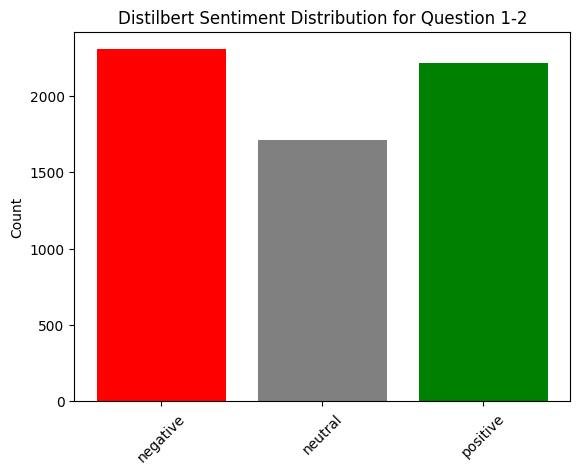

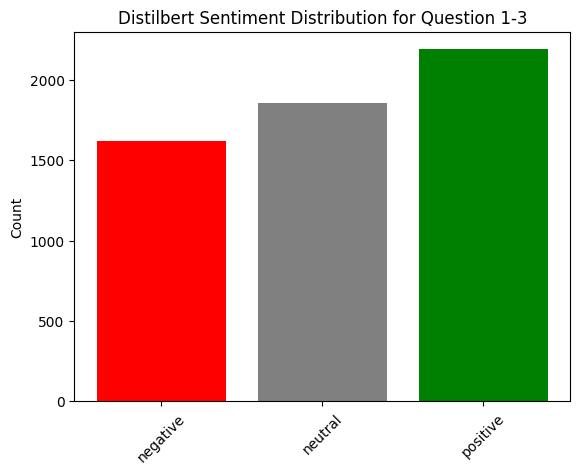

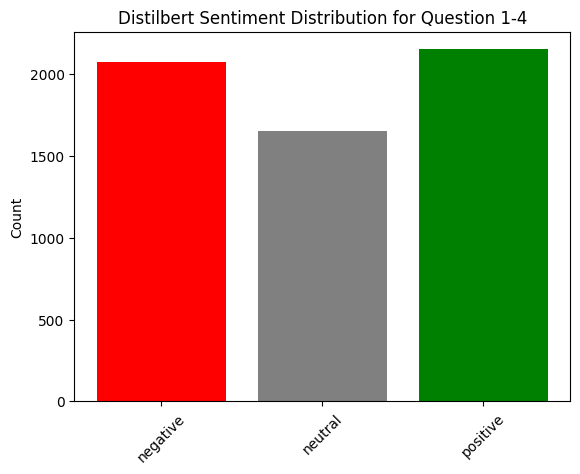

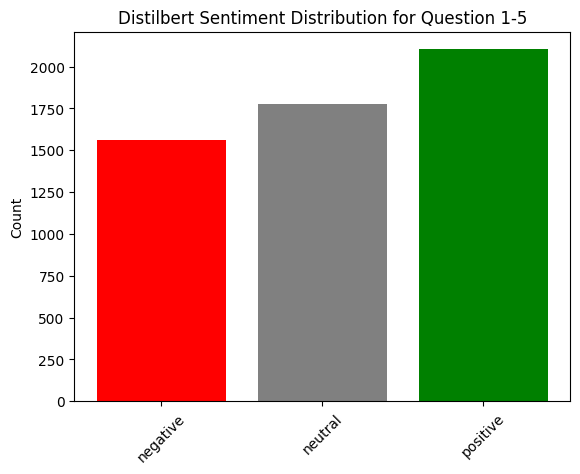

In [ ]:
questions = get_open_questions(1, conn, cursor)
responses_dict = get_open_responses(questions)
# Call the function to analyze sentiments in batches
distilbert_sentiment_summary = analyze_sentiments(responses_dict)
plot_sentiment_distribution(distilbert_sentiment_summary, 'Distilbert')
!cp db.sqlite /content/drive/MyDrive/DecodingDemocracy/

### Consultation 2 Sentiment Analysis


  0%|          | 0/23 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/transformers/pipelines/base.py:1101: UserWarning: You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
  warnings.warn(

100%|██████████| 23/23 [01:57<00:00,  5.11s/it]


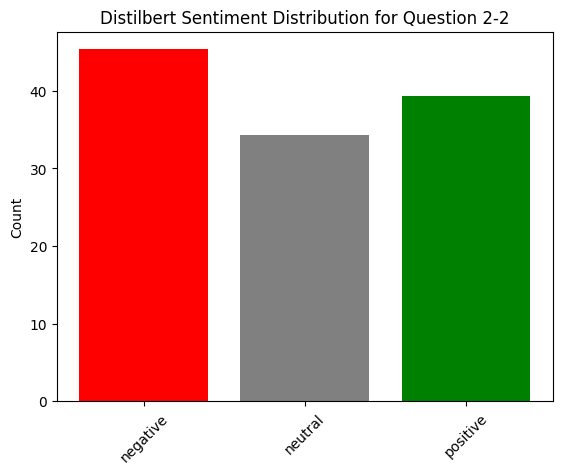

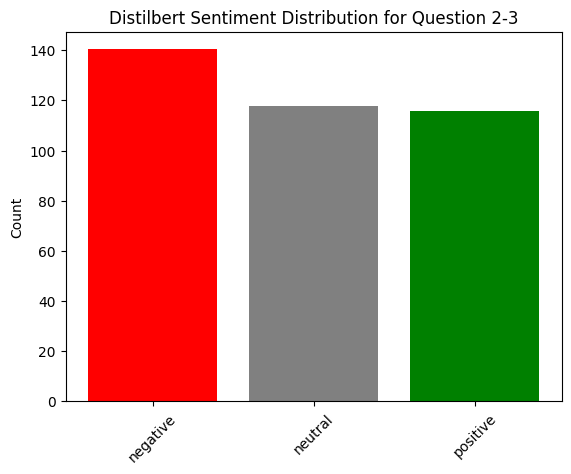

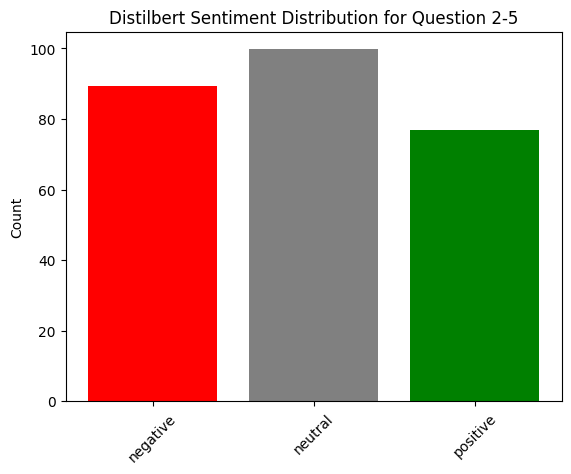

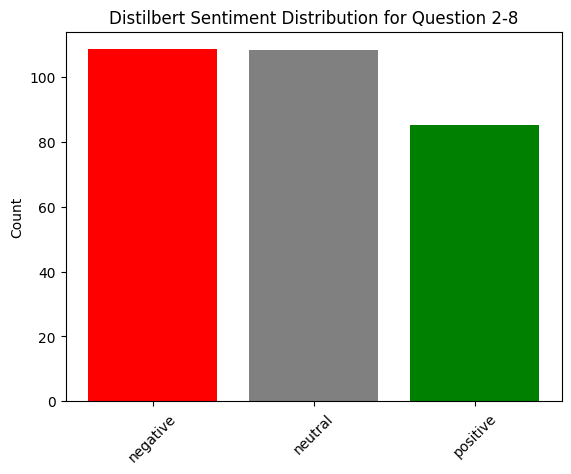

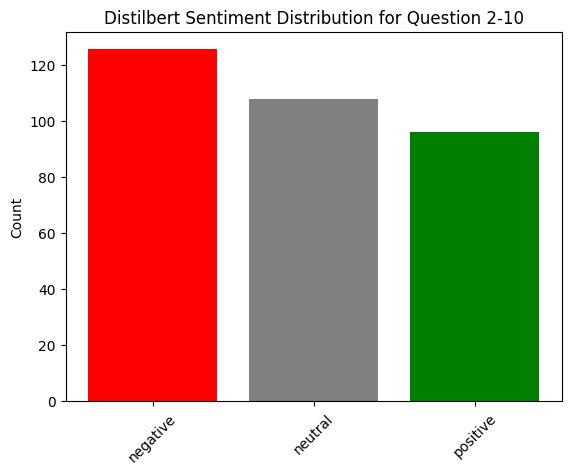

...

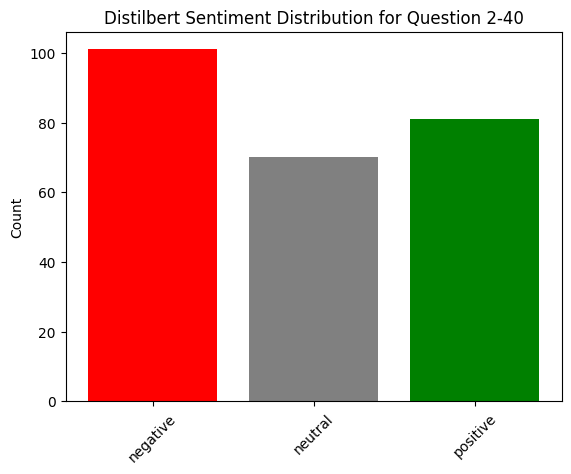

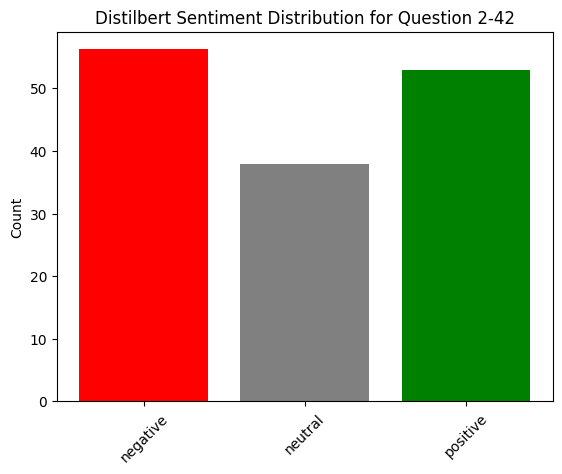

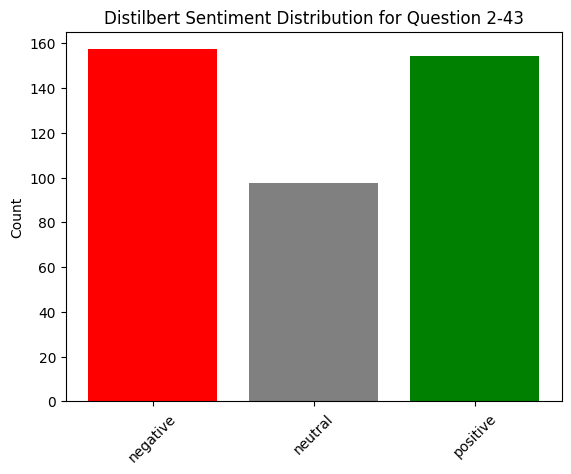

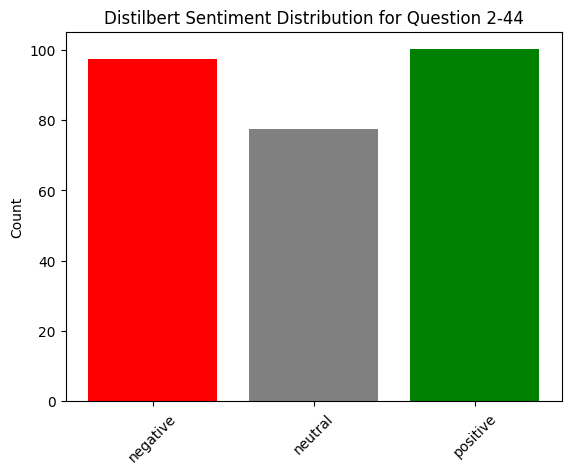

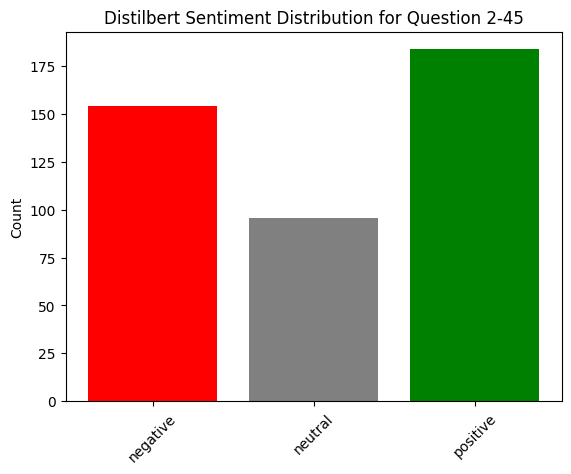

In [ ]:
questions = get_open_questions(2, conn, cursor)
responses_dict = get_open_responses(questions)
# Call the function to analyze sentiments in batches
distilbert_sentiment_summary = analyze_sentiments(responses_dict)
plot_sentiment_distribution(distilbert_sentiment_summary, 'Distilbert')
!cp db.sqlite /content/drive/MyDrive/DecodingDemocracy/

### Consultation 3 Sentiment Analysis


100%|██████████| 23/23 [00:49<00:00,  2.14s/it]


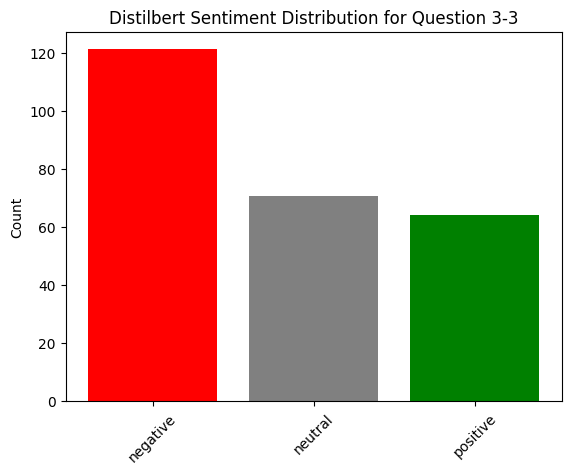

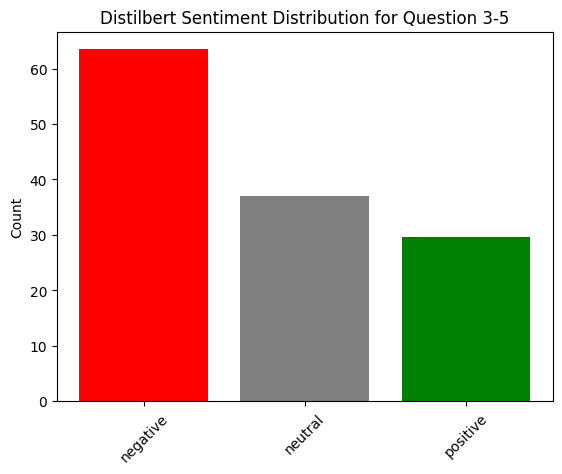

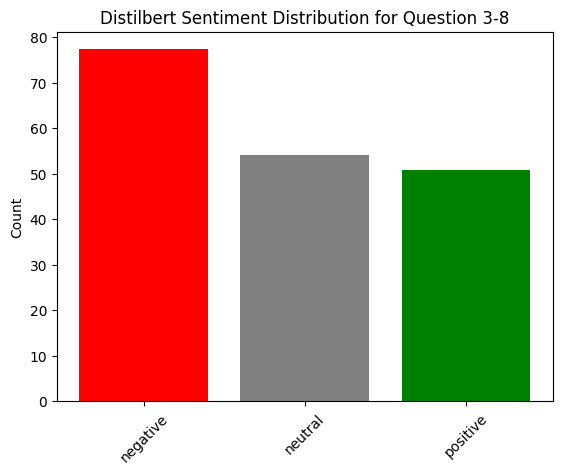

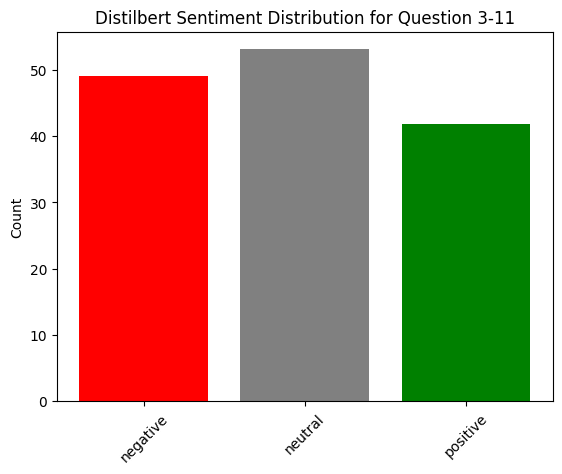

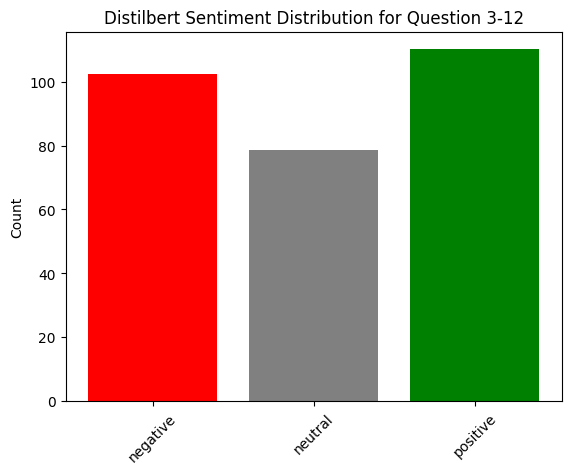

...

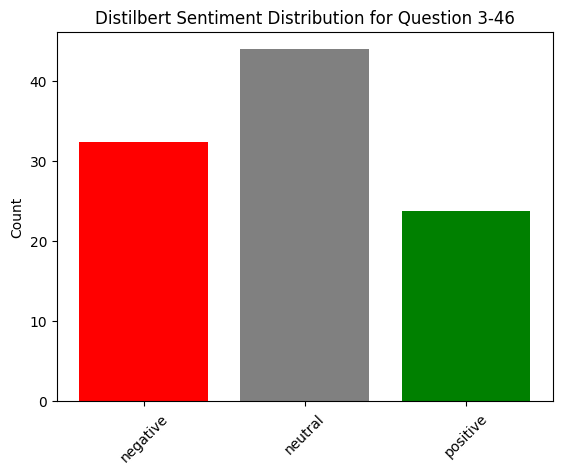

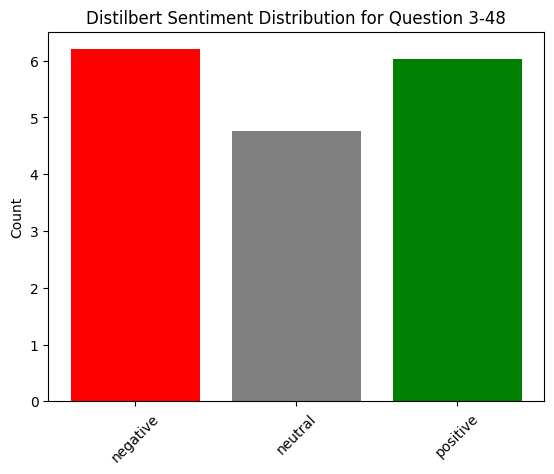

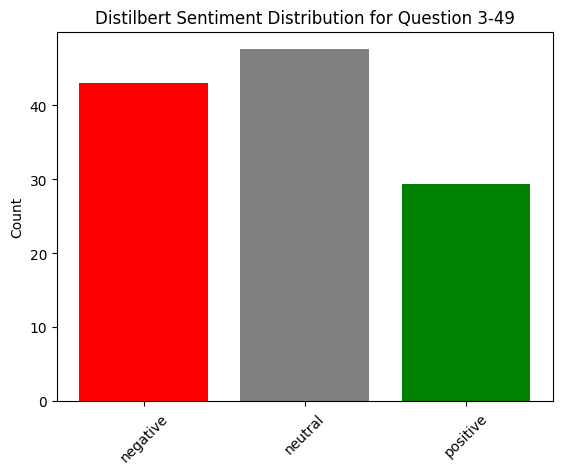

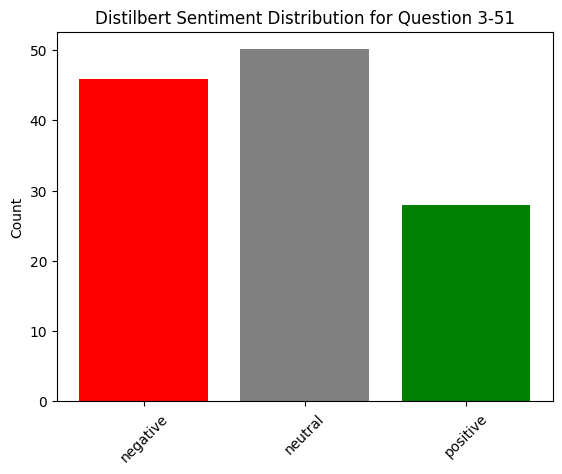

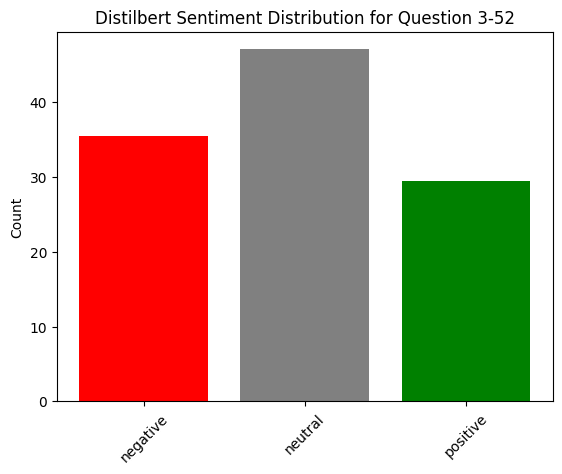

In [ ]:
questions = get_open_questions(3, conn, cursor)
responses_dict = get_open_responses(questions)
# Call the function to analyze sentiments in batches
distilbert_sentiment_summary = analyze_sentiments(responses_dict)
plot_sentiment_distribution(distilbert_sentiment_summary, 'Distilbert')
!cp db.sqlite /content/drive/MyDrive/DecodingDemocracy/

## Topic modelling

### Functions

In [ ]:
def generate_embeddings(responses, model):
    # Convert lists of tokens back to strings
    responses_str = [' '.join(tokens) for tokens in responses]

    # Generate embeddings
    embeddings = model.encode(responses_str, convert_to_tensor=True)

    # Convert embeddings to numpy and normalize
    embeddings_np = embeddings.cpu().numpy()
    embeddings_np = embeddings_np / np.linalg.norm(embeddings_np, axis=1, keepdims=True)

    return embeddings_np


def cluster_sentences(embeddings, responses):
    # Perform k-mean clustering
    clustering_model = AgglomerativeClustering(n_clusters=None, distance_threshold=3.5)
    clustering_model.fit(embeddings)
    cluster_assignment = clustering_model.labels_

    clustered_sentences = {}
    for sentence_id, cluster_id in enumerate(cluster_assignment):
        if cluster_id not in clustered_sentences:
            clustered_sentences[cluster_id] = []

        clustered_sentences[cluster_id].append(responses[sentence_id])

    return clustered_sentences, cluster_assignment

def get_cluster_labels(clustered_sentences):
    cluster_labels = {}
    for cluster_id, sentences in clustered_sentences.items():
        # Use the first sentence or a more sophisticated method to label the cluster
        cluster_labels[cluster_id] = sentences[0]  # This is a simplification
    return cluster_labels

def plot_top_words(lda_model, num_words, dictionary):
    num_topics = lda_model.num_topics  # Get the number of topics from the model

    for t in range(num_topics):
        plt.figure(figsize=(5,5))
        plt.title(f"Top words in topic {t}")

        # Get the top words for the topic
        top_words = {dictionary[word_id]: value for word_id, value in lda_model.get_topic_terms(t, topn=num_words)}

        plt.bar(range(len(top_words)), list(top_words.values()), align='center')
        plt.xticks(range(len(top_words)), list(top_words.keys()), rotation='vertical')
        plt.show()

def assign_responses_to_topics(lda_model, corpus):
    topic_assignments = []
    for doc in corpus:
        topics = lda_model.get_document_topics(doc)
        # Sort topics by probability and get the highest one
        topics = sorted(topics, key=lambda x: x[1], reverse=True)
        topic_assignments.append(topics[0][0])  # Get topic index
    return topic_assignments

def create_topic_mapping(response_ids, tokenized_texts, topic_assignments):
    response_topics = []

    # Iterate over response IDs, tokenized texts, and their corresponding topic assignments
    for response_id, tokens, topic_id in zip(response_ids, tokenized_texts, topic_assignments):
        # Reconstructing each document from preprocessed words
        reconstructed_document = " ".join(tokens)

        # Creating a data structure with response ID, document, and assigned topic
        data = {
            "response_id": response_id,
            "document": reconstructed_document,
            "topic": topic_id
        }
        response_topics.append(data)

    return response_topics


def plot_document_assignments(topic_assignments, lda_model):
    plt.figure(figsize=(10,5))
    plt.hist(topic_assignments, bins=range(lda_model.num_topics+1), align='left', rwidth=0.5)
    plt.xticks(range(lda_model.num_topics))
    plt.xticks(rotation=90)  # Rotates labels by 45 degrees
    plt.xlabel('Topic')
    plt.ylabel('Number of documents')
    plt.title('Document Assignments to Topics')
    plt.show()

def generate_wordcloud(dictionary, corpus_tfidf, question_id):
    stops = set([
      "a", "an", "the", "this", "that", "it", "is", "am", "are", "was", "were", "be", "being", "been",
      "have", "has", "had", "do", "does", "did", "doing", "and", "or", "but", "on", "in", "at", "by",
      "with", "of", "for", "as", "to", "from", "up", "down", "why", "how", "when", "where", "what",
      "should", "would", "could", "might", "may", "must", "shall", "can", "will", "i", "you", "he", "she",
      "we", "they", "my", "your", "his", "her", "its", "our", "their", "me", "him", "us", "them", "yours",
      "mine", "hers", "ours", "theirs","vote", "scottish", "Scotland", "referendum", "UK", "result", "postal",
      "will", "votes", "voter", "voting", "need", "must", "people", "think", "see"
    ])
    # Aggregate TF-IDF scores for all words across the responses
    word_scores = defaultdict(float)
    for doc in corpus_tfidf:
        for word_id, score in doc:
            word_scores[word_id] += score

    # Convert word IDs back to words and filter out stop words
    aggregated_words = {dictionary[word_id]: score for word_id, score in word_scores.items() if dictionary[word_id] not in stops}

    # Sort words by their aggregated score
    sorted_words = sorted(aggregated_words.items(), key=lambda x: x[1], reverse=True)

    # Create a string of words weighted by TF-IDF scores
    weighted_words_text = " ".join([word for word, score in sorted_words])

    try:
      # Generate the word cloud
      cloud = WordCloud(stopwords=stops, background_color='black', colormap="Dark2").generate(weighted_words_text)
      plt.figure(figsize=(10,8))
      plt.imshow(cloud)
      plt.title(f"Word Cloud for Responses {question_id}")
      plt.axis("off")
      plt.show()
    except Exception as e:
      print(f'Error generating wordcloud: {e}')

def get_topic_labels(lda_model, num_top_words=10):
    num_topics = lda_model.num_topics
    topic_labels = {}
    for topic_id in range(num_topics):
        top_words = lda_model.show_topic(topic_id, topn=num_top_words)
        words_for_topic = [word for word, _ in top_words]

        topic_labels[topic_id] = ", ".join(words_for_topic) if words_for_topic else "No label"

    return topic_labels


def map_topics_to_clusters(topic_assignments, cluster_assignment):
    topic_cluster_map = {}
    for cluster_id in set(cluster_assignment):
        # Filter topic assignments by cluster
        topics_in_cluster = [topic_assignments[i] for i, id in enumerate(cluster_assignment) if cluster_id == id]
        # Find the most common topic in this cluster
        most_common_topic = Counter(topics_in_cluster).most_common(1)[0][0]
        topic_cluster_map[most_common_topic] = cluster_id
    return topic_cluster_map

def insert_cluster_data(cluster_data, question_id):
  # Inserting data into Clusters table
  for id,cluster in cluster_data.items():
      cluster_id = question_id + '-' + str(id)
      cluster_label = str(cluster)
      cursor.execute("REPLACE INTO Clusters (cluster_id, cluster_label) VALUES (?, ?)", [cluster_id, cluster_label])
  conn.commit()

def insert_topic_data(topic_data, question_id, topic_cluster_map):
  # Inserting data into Topics table
  for id,topic in topic_data.items():
    topic_id = question_id + '-' + str(id)
    topic_label = str(topic)
    cluster_id = question_id + '-' + str(topic_cluster_map.get(id,None))
    cursor.execute("REPLACE INTO Topics (topic_id, topic_label, cluster_id) VALUES (?, ?, ?)", [topic_id, topic_label, cluster_id])
  conn.commit()

def insert_response_topic_data(response_topics, question_id, topic_cluster_map):
  # Inserting data into Response table
  for obj in response_topics:
      response_id = obj['response_id']
      topic_id = question_id + '-' + str(obj['topic'])
      cluster_id = question_id + '-' + str(topic_cluster_map.get(obj['topic'],None))
      sql = "UPDATE Response SET topic_id = ?, cluster_id = ? WHERE id = ?"
      cursor.execute(sql, [topic_id, cluster_id, response_id])
  conn.commit()

### Response processing
Pre process responses to get tokenised data, cluster responses, perform tfidf to weight tokens more accurately, perform lda to assign topics to responses.


In [ ]:
model = SentenceTransformer('all-MiniLM-L6-v2')

def process_responses(responses, question_id):

  # Preprocess responses for LDA
  # Separate IDs and tokenized texts
  response_ids = [resp[0] for resp in responses]
  tokenized_responses = [pre_process(resp[1], stopwords) for resp in responses]

  # Get embeddings for the responses (vector of floating points)
  embeddings = generate_embeddings(tokenized_responses, model)

  # Get clusters and labels for the clusters (labels can be improved)
  clustered_sentences, cluster_assignment = cluster_sentences(embeddings, tokenized_responses)
  cluster_labels = get_cluster_labels(clustered_sentences)
  num_topics = len(cluster_labels) # number of topics = number of clusters

  # Dictionary and corpus of the responses (word:id mapping and word frequencies)
  dictionary = corpora.Dictionary(tokenized_responses)
  corpus = [dictionary.doc2bow(resp) for resp in tokenized_responses]

  # TF-IDF model (measures how important terms are relative to the corpus of responses)
  tfidf = models.TfidfModel(corpus)
  corpus_tfidf = tfidf[corpus] # Apply the TF-IDF model to the corpus

  # Apply LDA model to the TF-IDF corpus
  lda_model = LdaMulticore(corpus_tfidf, num_topics=num_topics, id2word=dictionary, passes=20, iterations=400, workers=2)

  # Assign responses to topics and creaete a mapping of each response to its topic
  topic_assignments = assign_responses_to_topics(lda_model, corpus)
  response_topics = create_topic_mapping(response_ids, tokenized_responses, topic_assignments)

  # # Plot top words for each topic
  # plot_top_words(lda_model, 10, dictionary)  # Adjust 'num_words' as needed

  # # Plot document assignments to topics
  # plot_document_assignments(topic_assignments, lda_model)

  # Generate word clouds for each topic
  generate_wordcloud(dictionary, corpus_tfidf, question_id)

  # Get topic labels and map topics to clusters
  topic_labels = get_topic_labels(lda_model, num_top_words=10)
  topic_cluster_map = map_topics_to_clusters(topic_assignments, cluster_labels)

  # Insert data into database
  insert_cluster_data(cluster_labels, question_id)
  insert_topic_data(topic_labels, question_id, topic_cluster_map)
  insert_response_topic_data(response_topics, question_id, topic_cluster_map)

  !cp db.sqlite /content/drive/MyDrive/DecodingDemocracy/

  return response_topics


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


.gitattributes:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

data_config.json:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

train_script.py:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

### Consultation 1 Processing

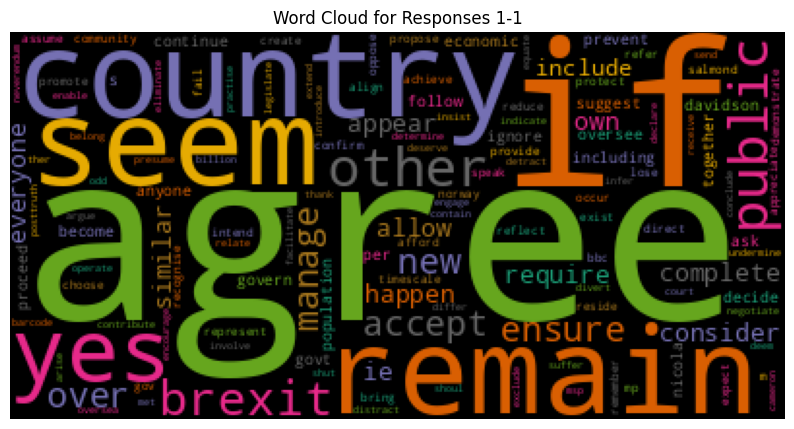

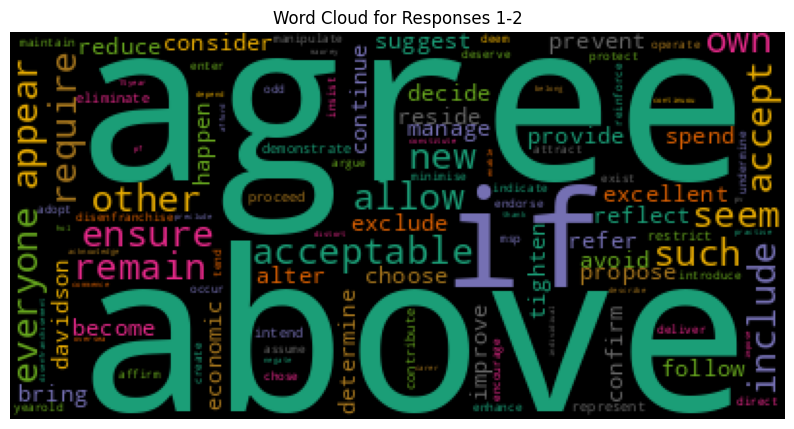

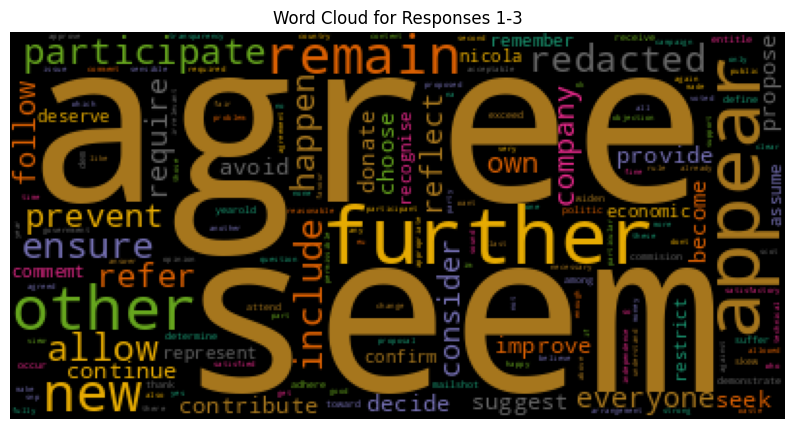

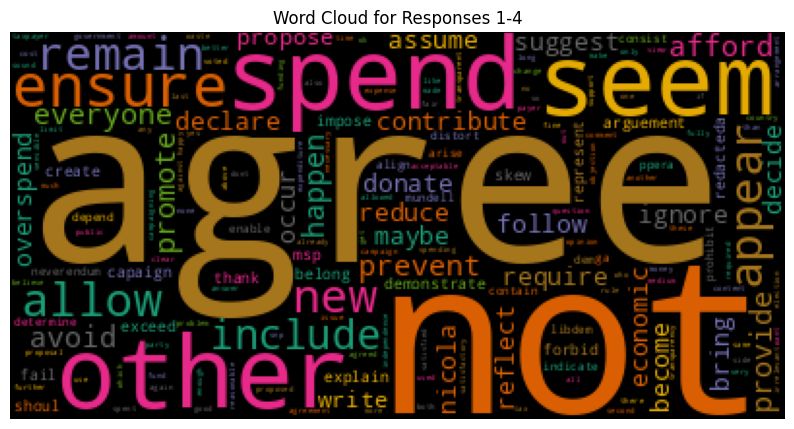

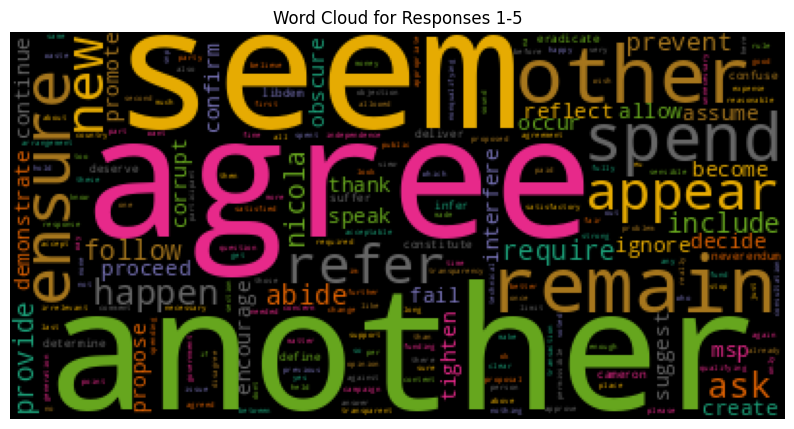

In [ ]:
question_ids = get_open_questions(1,conn,cursor)
for id in question_ids:
  responses = get_responses_to_question(id)
  response_topics = process_responses(responses, id)

### Consultation 2 Processing

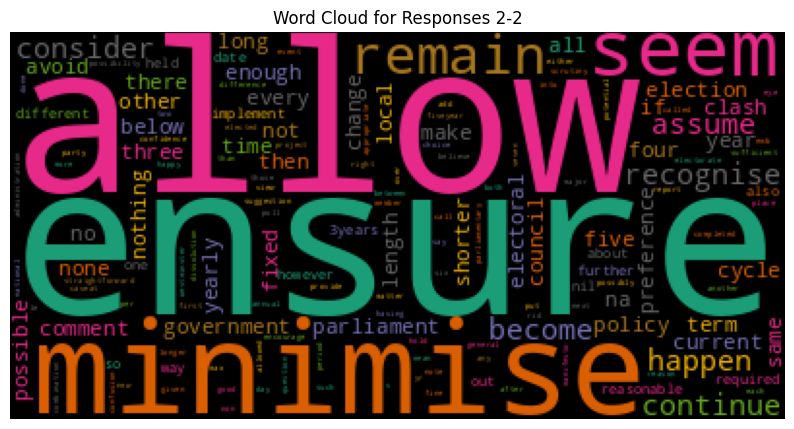

  0%|          | 0/119 [00:00<?, ?it/s]

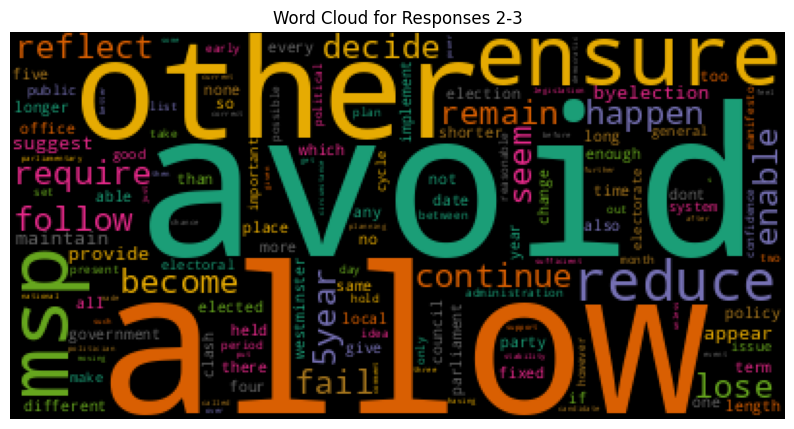


  0%|          | 0/119 [00:07<?, ?it/s]


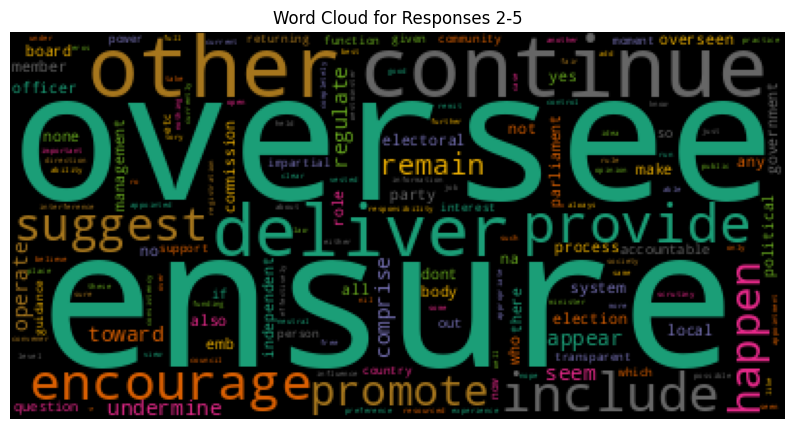

  0%|          | 0/374 [00:05<?, ?it/s]


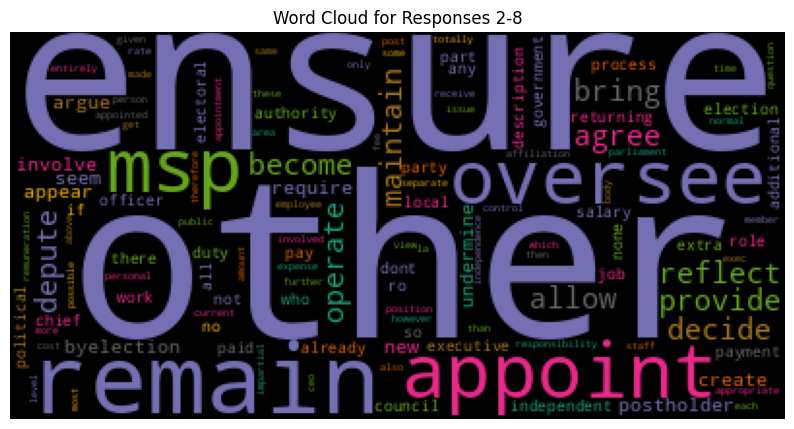


  0%|          | 0/266 [00:07<?, ?it/s]


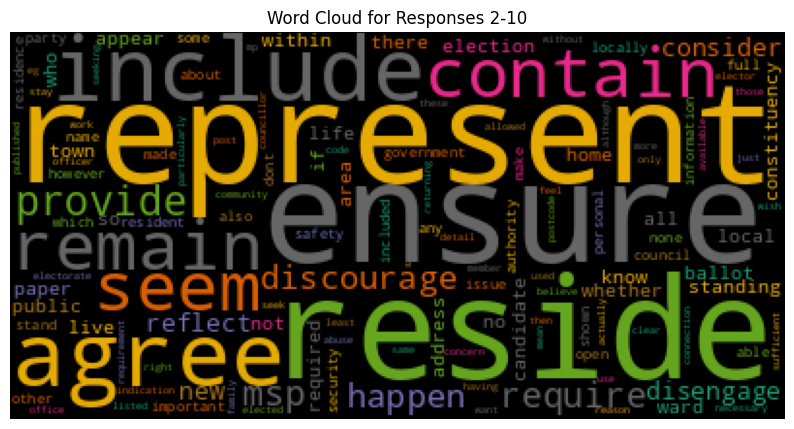

  0%|          | 0/302 [00:06<?, ?it/s]
/usr/local/lib/python3.10/dist-packages/gensim/models/ldamodel.py:847: RuntimeWarning: invalid value encountered in double_scalars
  perwordbound = self.bound(chunk, subsample_ratio=subsample_ratio) / (subsample_ratio * corpus_words)


Error generating wordcloud: We need at least 1 word to plot a word cloud, got 0.



  0%|          | 0/329 [00:00<?, ?it/s]
/usr/local/lib/python3.10/dist-packages/gensim/models/ldamodel.py:847: RuntimeWarning: invalid value encountered in double_scalars
  perwordbound = self.bound(chunk, subsample_ratio=subsample_ratio) / (subsample_ratio * corpus_words)


Error generating wordcloud: We need at least 1 word to plot a word cloud, got 0.


  0%|          | 0/79 [00:00<?, ?it/s]


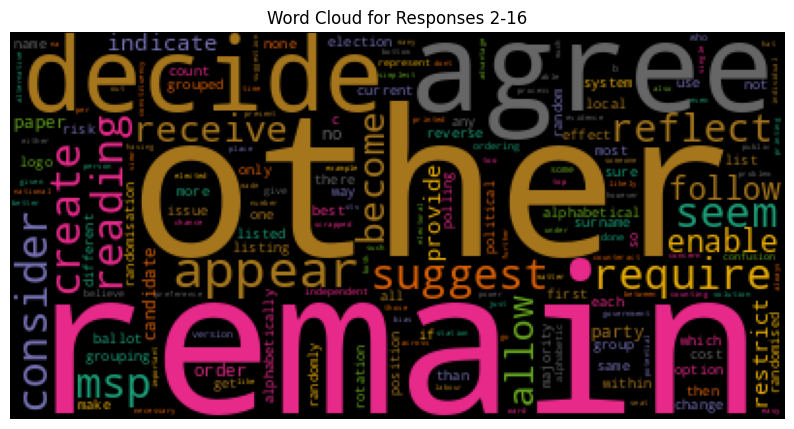


  0%|          | 0/61 [00:06<?, ?it/s]


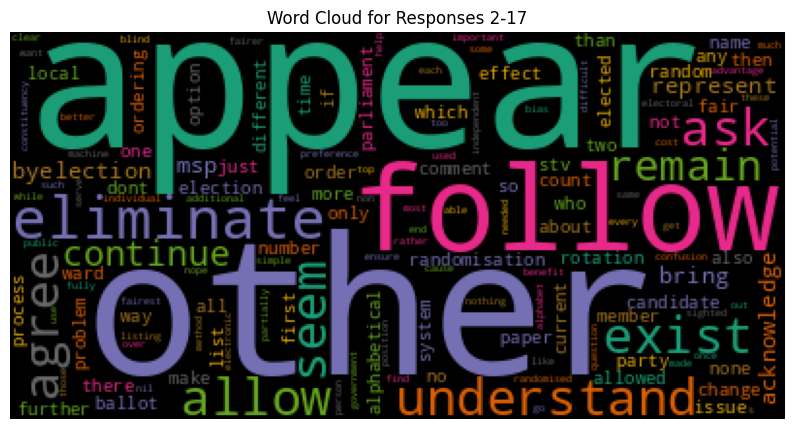

  0%|          | 0/176 [00:05<?, ?it/s]


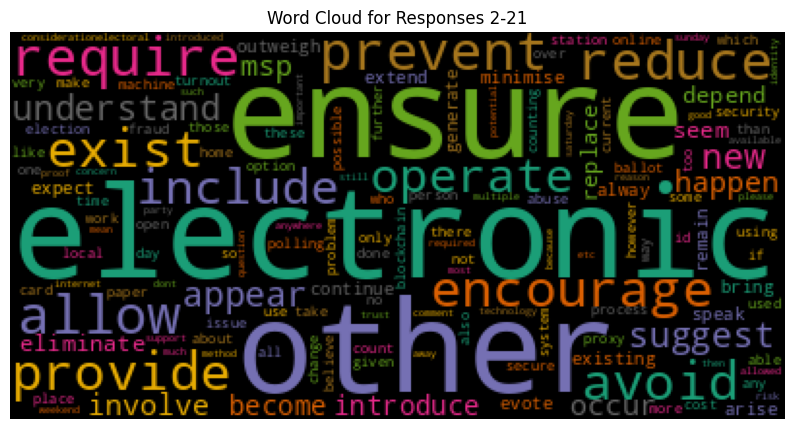


  0%|          | 0/240 [00:11<?, ?it/s]


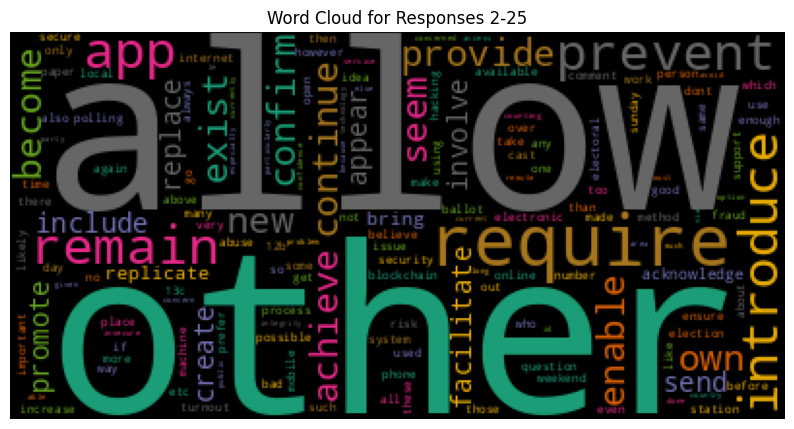

  0%|          | 0/367 [00:09<?, ?it/s]


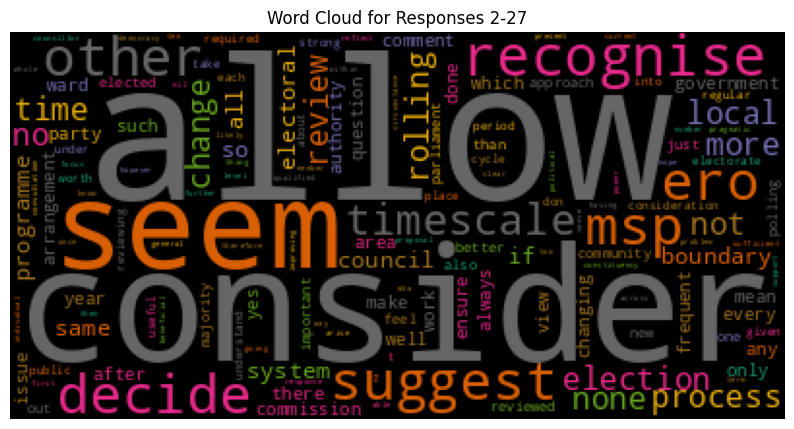


  0%|          | 0/350 [00:04<?, ?it/s]


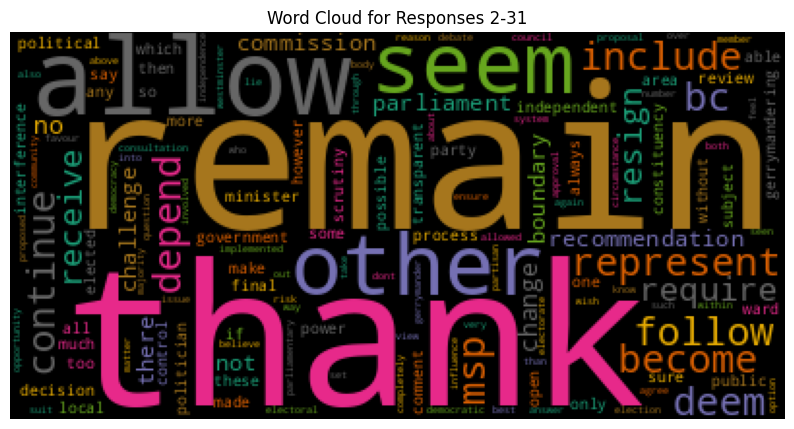

  0%|          | 0/177 [00:07<?, ?it/s]


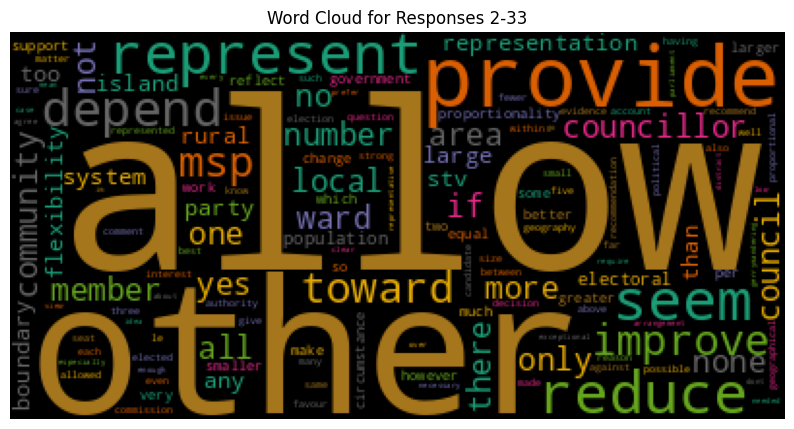


  0%|          | 0/321 [00:07<?, ?it/s]


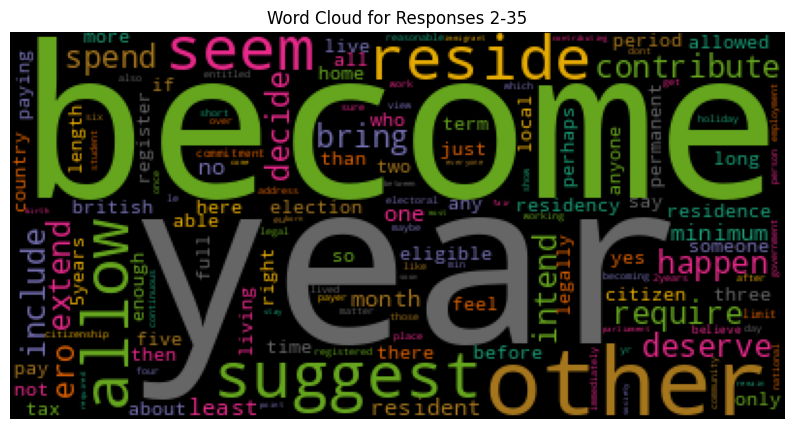

  0%|          | 0/177 [00:08<?, ?it/s]


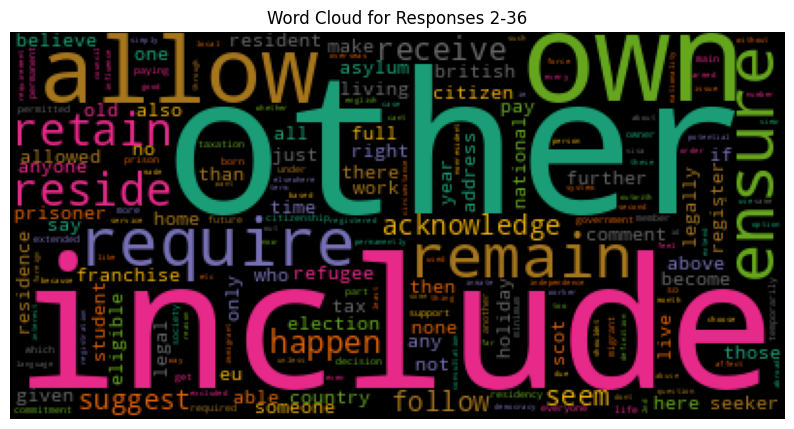


  0%|          | 0/575 [00:08<?, ?it/s]


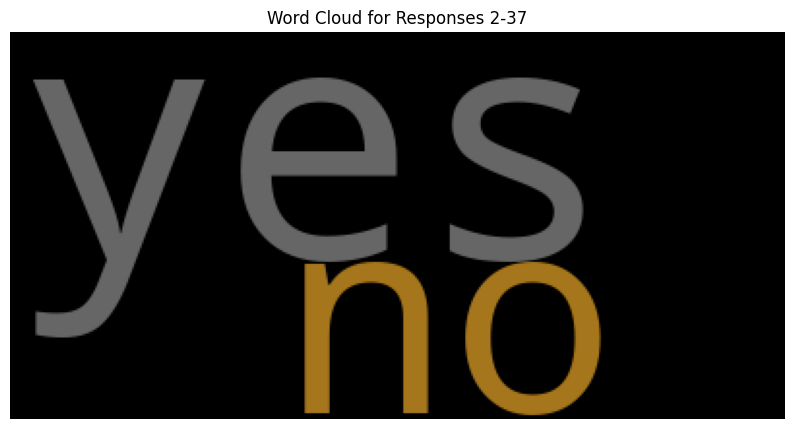

  0%|          | 0/307 [00:06<?, ?it/s]


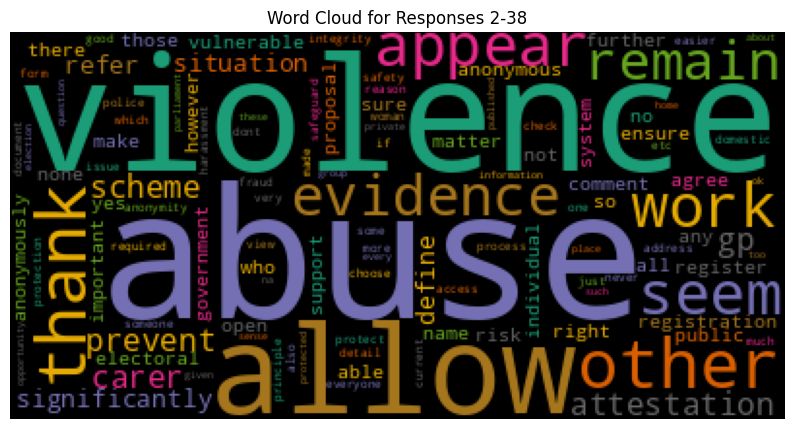


  0%|          | 0/714 [00:06<?, ?it/s]


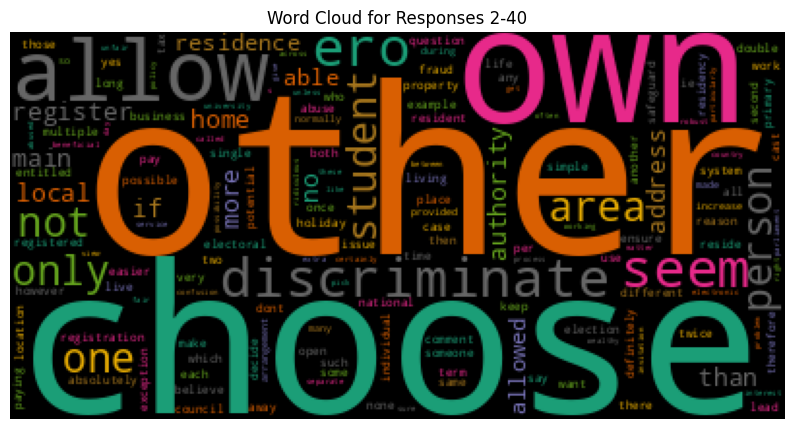

  0%|          | 0/151 [00:05<?, ?it/s]


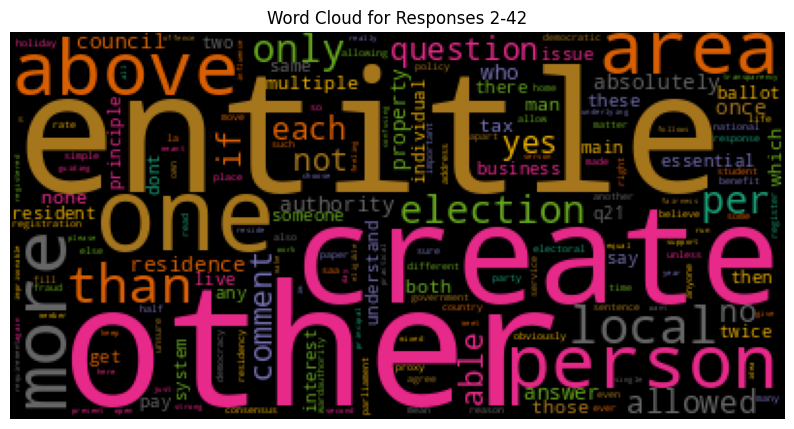


  0%|          | 0/252 [00:03<?, ?it/s]


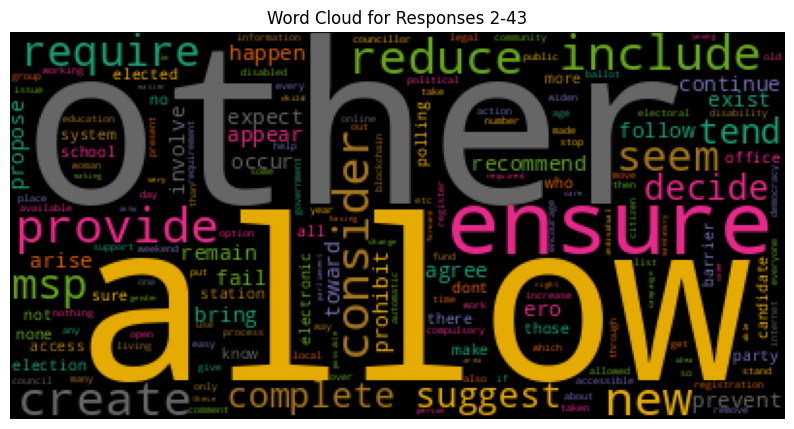

  0%|          | 0/147 [00:12<?, ?it/s]


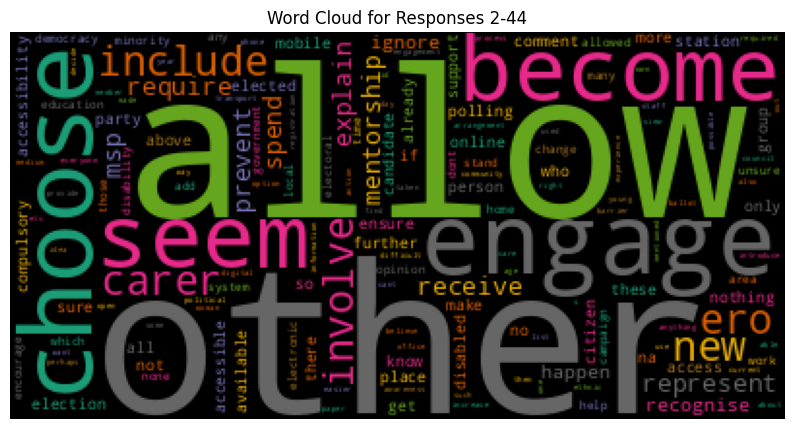


  0%|          | 0/409 [00:07<?, ?it/s]


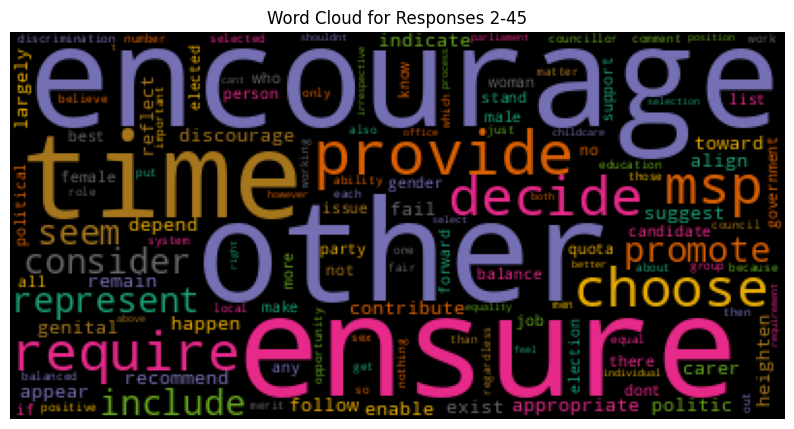

  0%|          | 0/433 [00:00<?, ?it/s]

In [ ]:
question_ids = get_open_questions(2,conn,cursor)
for id in question_ids:
  responses = get_responses_to_question(id)
  response_topics = tqdm(process_responses(responses, id))

### Consultation 3 Processing

  0%|          | 0/275 [00:15<?, ?it/s]


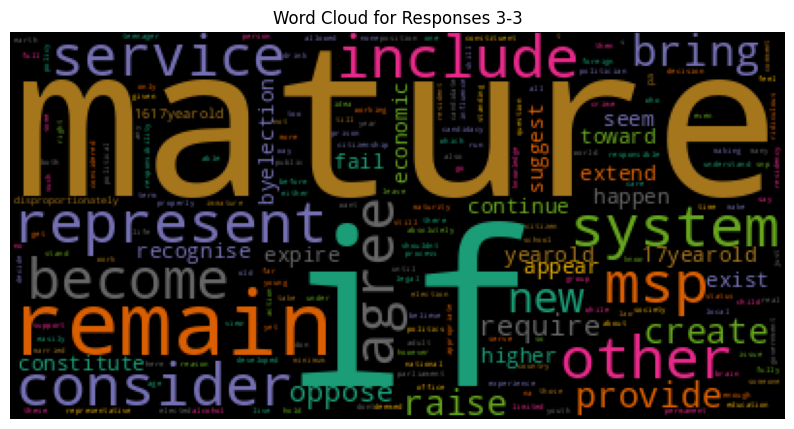


  0%|          | 0/433 [00:08<?, ?it/s]


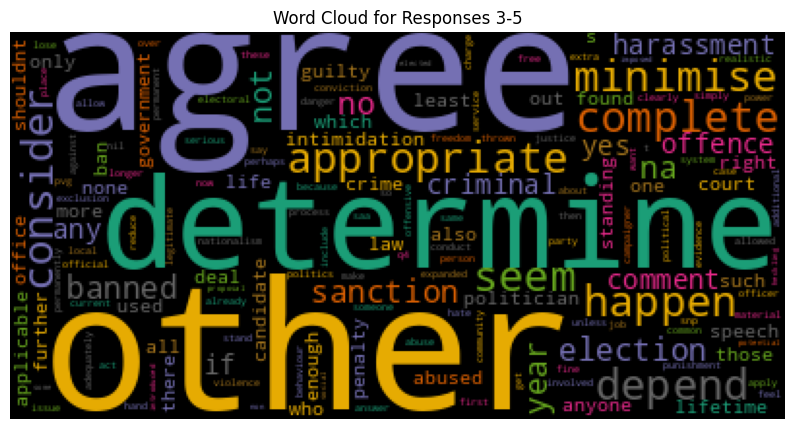

  0%|          | 0/256 [00:03<?, ?it/s]


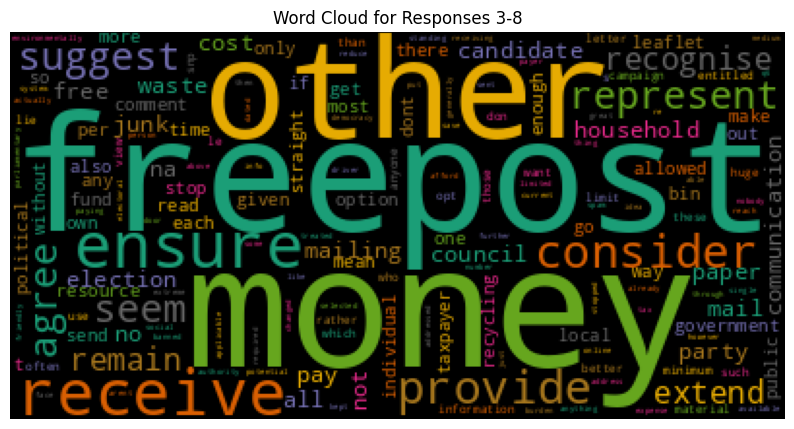


  0%|          | 0/130 [00:04<?, ?it/s]


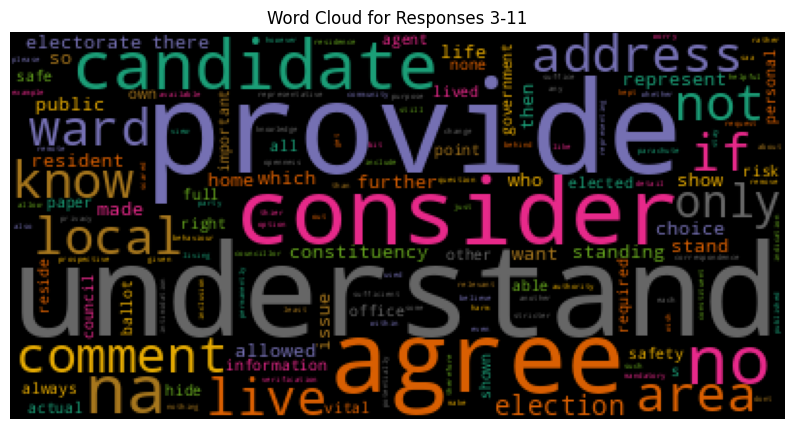

  0%|          | 0/182 [00:03<?, ?it/s]


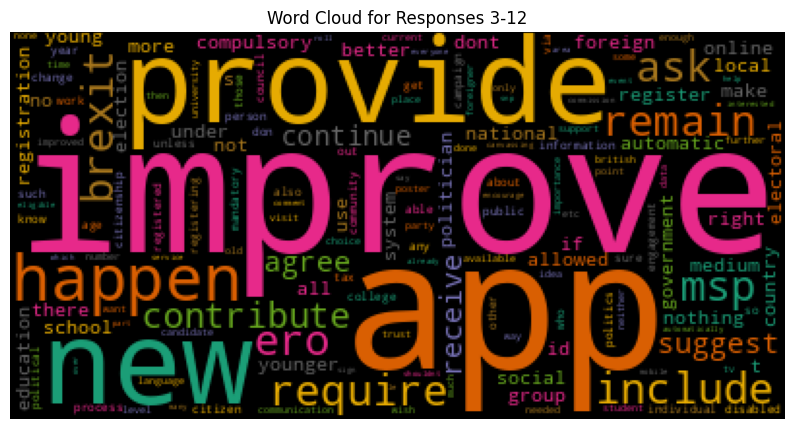


  0%|          | 0/144 [00:06<?, ?it/s]


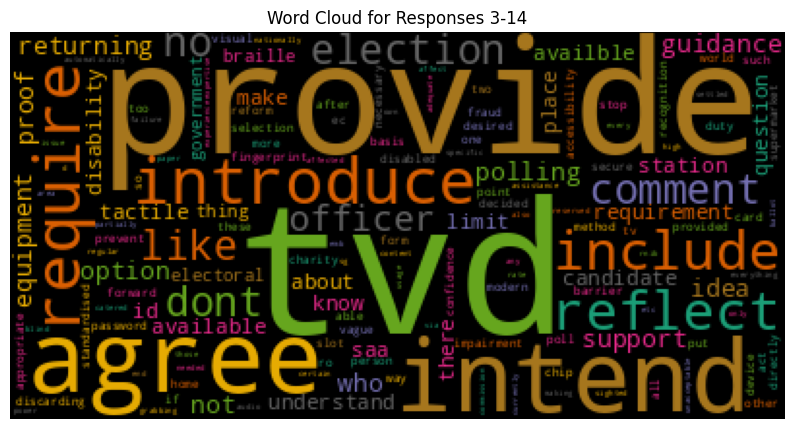

  0%|          | 0/291 [00:01<?, ?it/s]


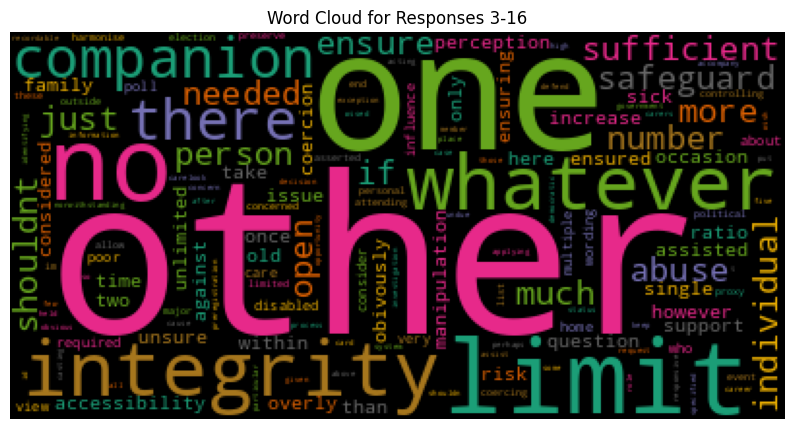


  0%|          | 0/26 [00:01<?, ?it/s]


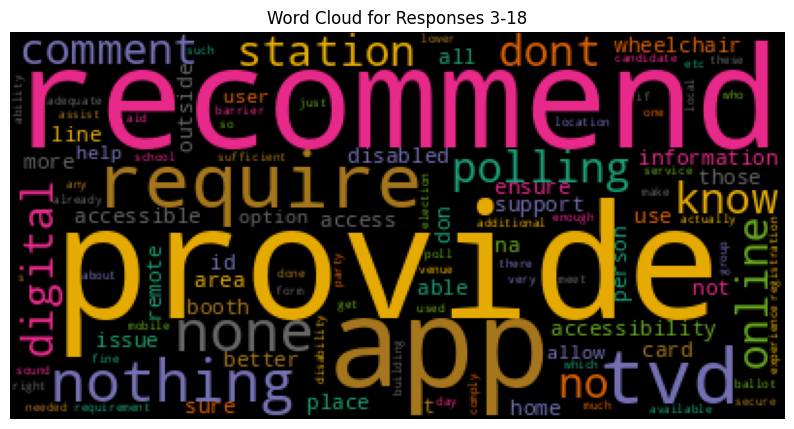

  0%|          | 0/32 [00:05<?, ?it/s]


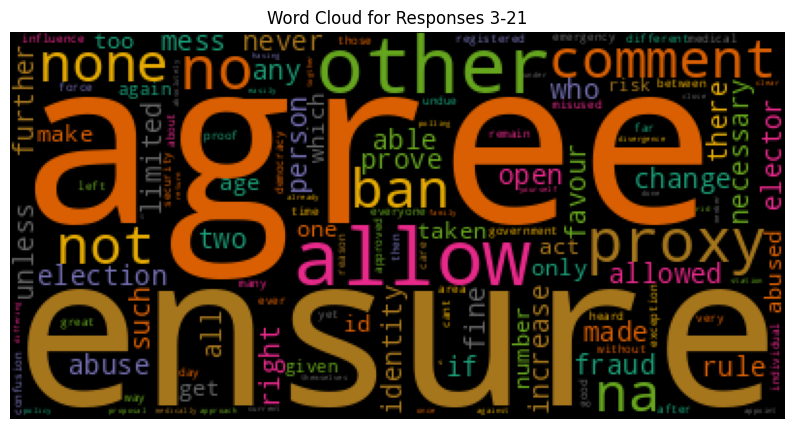


  0%|          | 0/174 [00:02<?, ?it/s]


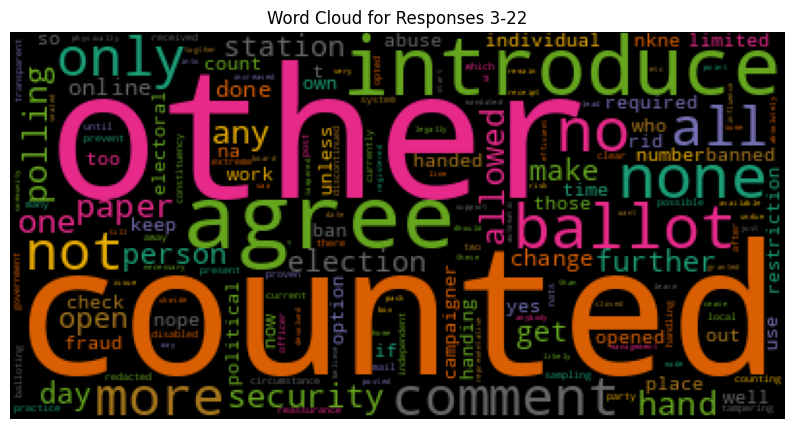

  0%|          | 0/133 [00:02<?, ?it/s]


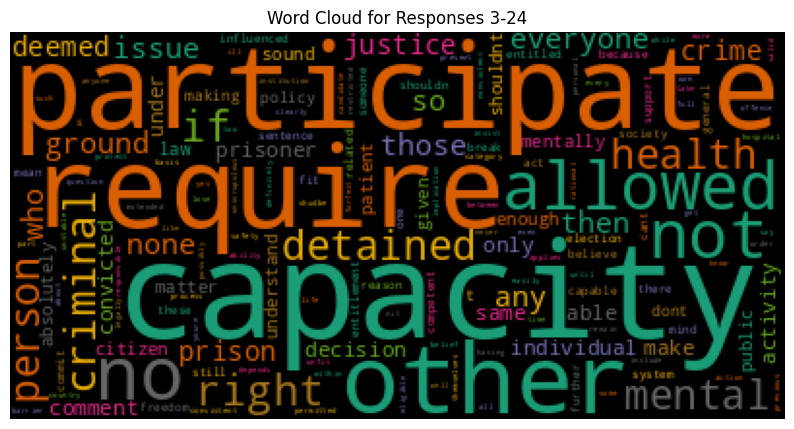


  0%|          | 0/150 [00:03<?, ?it/s]


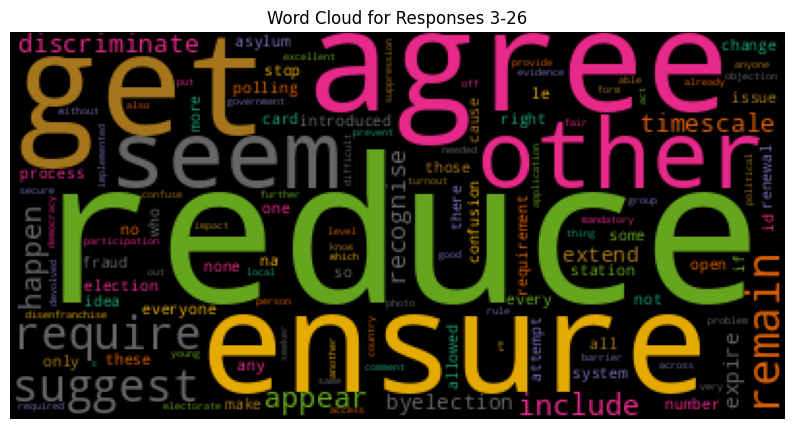

  0%|          | 0/163 [00:07<?, ?it/s]


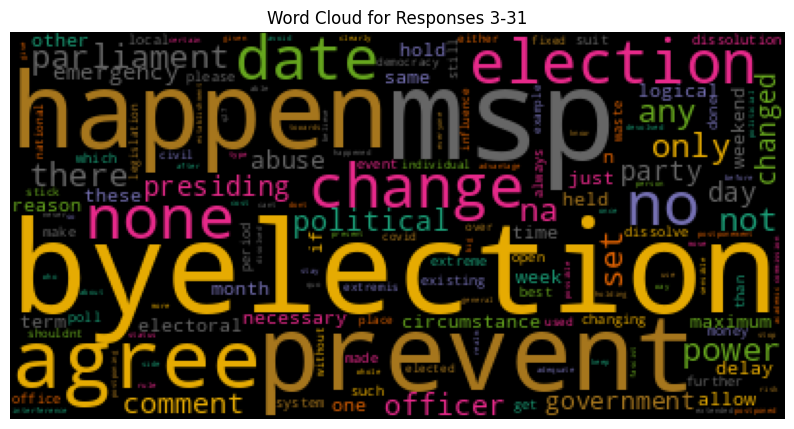


  0%|          | 0/243 [00:02<?, ?it/s]


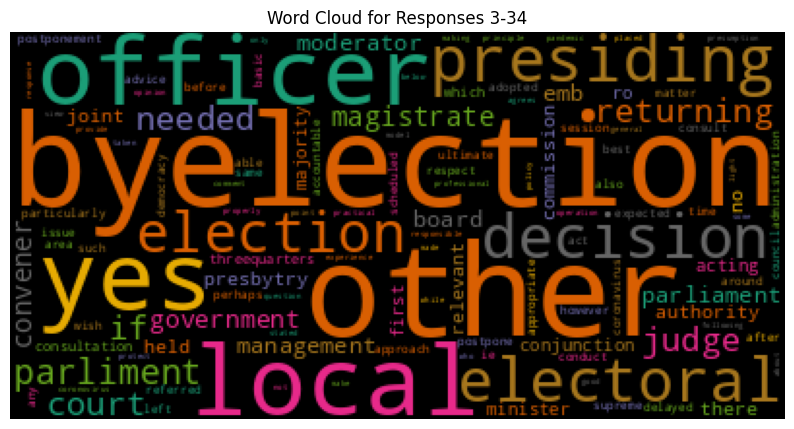

  0%|          | 0/132 [00:01<?, ?it/s]


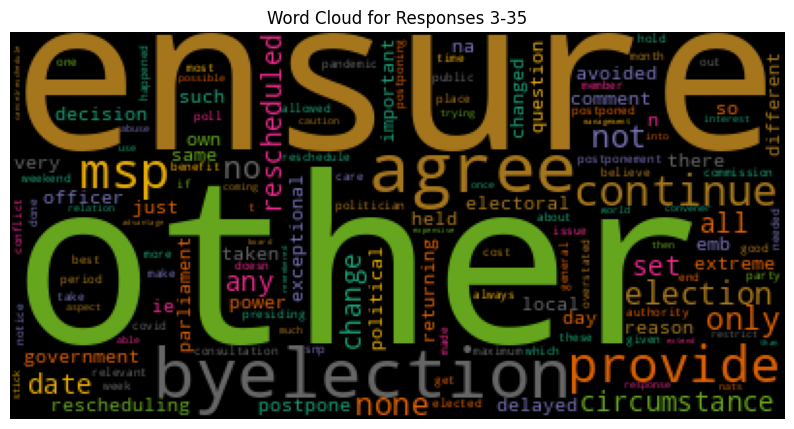


  0%|          | 0/15 [00:02<?, ?it/s]


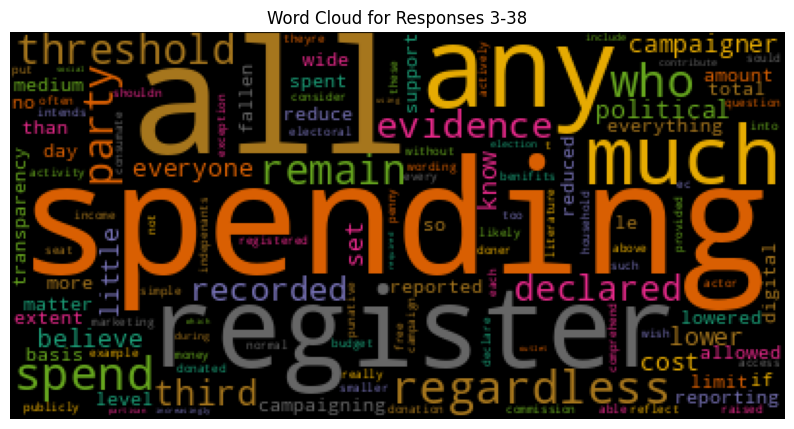

  0%|          | 0/128 [00:01<?, ?it/s]


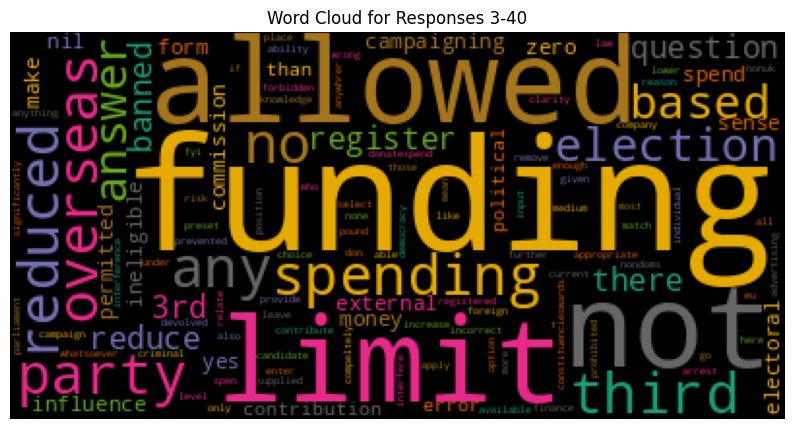


  0%|          | 0/21 [00:02<?, ?it/s]


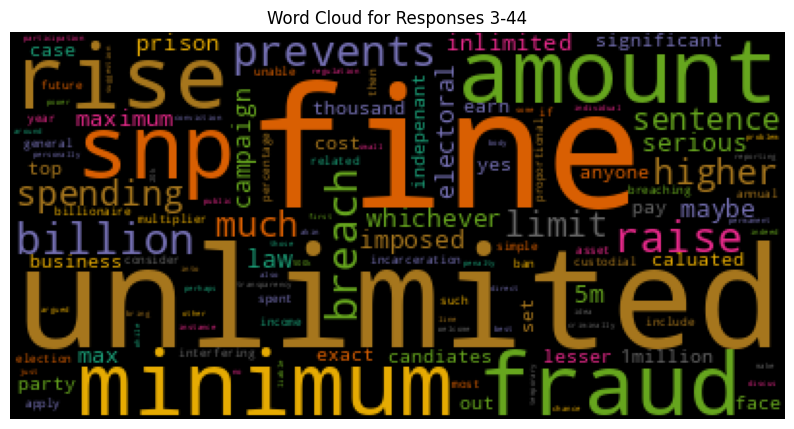

  0%|          | 0/63 [00:01<?, ?it/s]


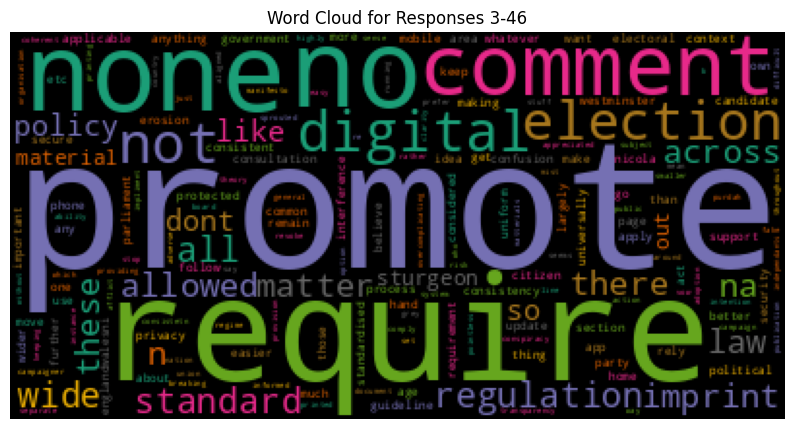


  0%|          | 0/32 [00:03<?, ?it/s]


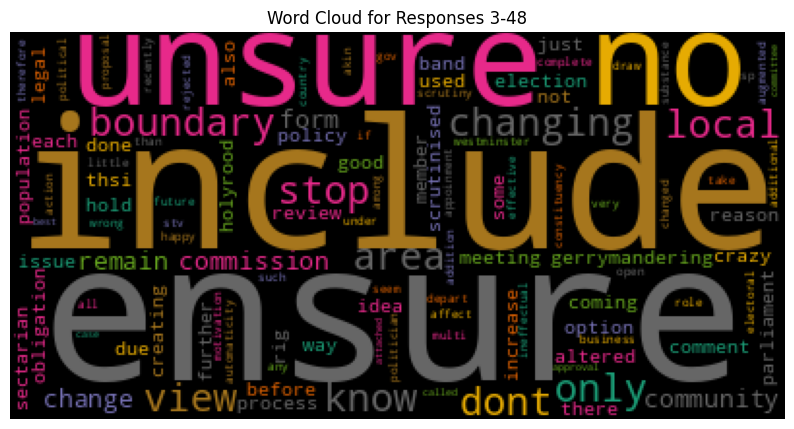

  0%|          | 0/100 [00:01<?, ?it/s]


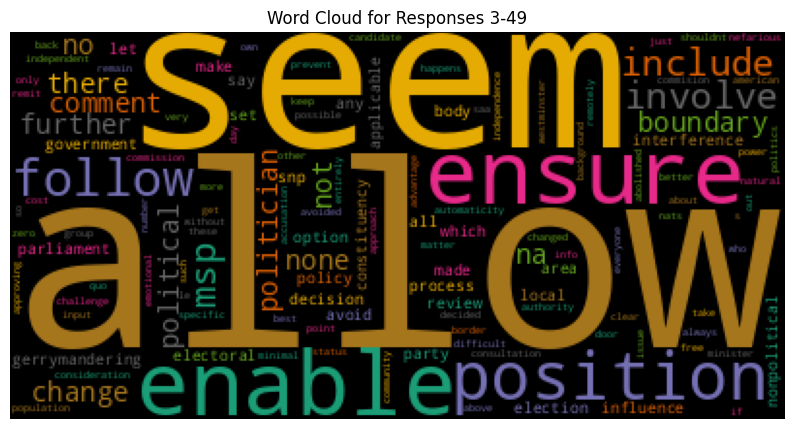


  0%|          | 0/17 [00:05<?, ?it/s]


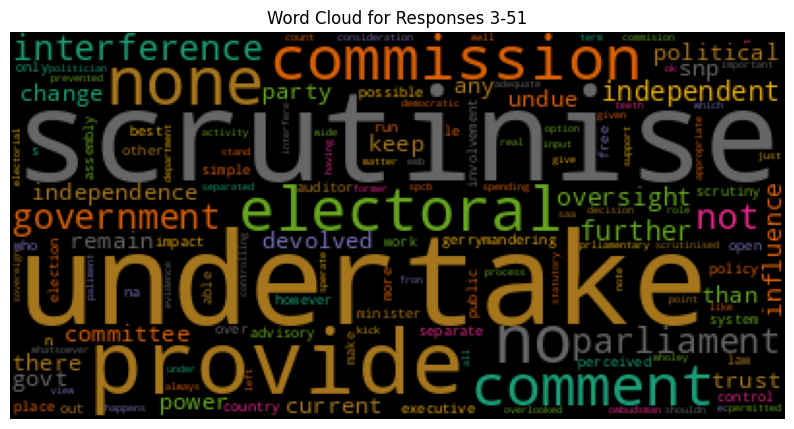

  0%|          | 0/120 [00:02<?, ?it/s]


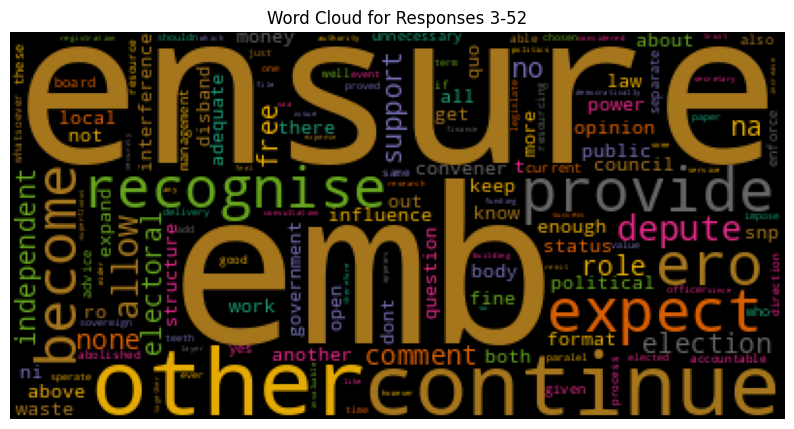


  0%|          | 0/112 [00:00<?, ?it/s]

In [ ]:
question_ids = get_open_questions(3,conn,cursor)
for id in question_ids:
  responses = get_responses_to_question(id)
  response_topics = tqdm(process_responses(responses, id))

### Visualisation of clusters

In [ ]:
tsne_model = TSNE(n_components=2, random_state=0)
reduced_embeddings = tsne_model.fit_transform(embeddings.cpu().numpy())

# Create a DataFrame for the plot
import pandas as pd
plot_data = pd.DataFrame({
    'Component 1': reduced_embeddings[:,0],
    'Component 2': reduced_embeddings[:,1],
    'Cluster': cluster_assignment
})

# Create a scatter plot
plt.figure(figsize=(10, 10))
sns.scatterplot(x='Component 1', y='Component 2', hue='Cluster', data=plot_data, palette="deep")
plt.title("Cluster Visualization")
plt.show()


### Combine Topic and Sentiment Analysis

See how people feel about the topics that were found.